In [1]:
import numpy as np
import pandas as pd
import os
from sklearn import preprocessing
from sklearn import tree
from sklearn import ensemble
from sklearn import svm
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
#descision tree

def evaluate(y_test,y_pred,y_scores):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='binary')
    recall = recall_score(y_test, y_pred, average='binary',pos_label=1)
    f1 = f1_score(y_test, y_pred, average='binary')
    auc = roc_auc_score(y_test, y_scores)
    return [accuracy,precision,recall,f1,auc]

def decsion_tree(X_train,y_train,X_test,y_test):
    clf = tree.DecisionTreeClassifier(max_depth=5)
    clf = clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    y_scores = clf.predict_proba(X_test)[:,1]
    return evaluate(y_test,y_pred,y_scores)

#randomforest

def forest_tree(X_train,y_train,X_test,y_test):
    clf = ensemble.RandomForestClassifier(n_estimators=100)
    clf = clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    y_scores = clf.predict_proba(X_test)[:,1]
    return evaluate(y_test,y_pred,y_scores)


def svm_one_class(X_train,y_train,X_test,y_test):
    _train = preprocessing.normalize(X_train, norm='l2')
    _test = preprocessing.normalize(X_test, norm='l2')
    lin_clf = svm.LinearSVC()
    lin_clf.fit(_train, y_train)
    LinearSVC(C=1.0, class_weight=None, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)
    y_pred = lin_clf.predict(_test)
    y_scores = lin_clf.decision_function(_test)
    return evaluate(y_test,y_pred,y_scores)


def svm_norm(X_train,y_train,X_test,y_test):
    _train = preprocessing.normalize(X_train, norm='l2')
    _test = preprocessing.normalize(X_test, norm='l2')
    clf = svm.SVC(kernel='linear', C=1,probability=True).fit(_train, y_train)
    y_pred = clf.predict(_test)
    y_scores = clf.decision_function(_test)
    return evaluate(y_test,y_pred,y_scores)

def gaussian_nb(X_train,y_train,X_test,y_test):
    gnb = GaussianNB()
    y_pred = gnb.fit(X_train, y_train).predict(X_test)
    y_scores  = gnb.fit(X_train, y_train).predict_proba(X_test)[:,1]
    accuracy = float(X_test.shape[0]-(y_test != y_pred).sum())/float(X_test.shape[0])
    precision = precision_score(y_test, y_pred, average='binary')
    recall = recall_score(y_test, y_pred, average='binary',pos_label=1)
    f1 = f1_score(y_test, y_pred, average='binary')
    auc = roc_auc_score(y_test, y_scores)
    return [accuracy,precision,recall,f1,auc]


def knn_classify(X_train,y_train,X_test,y_test):
    clf = KNeighborsClassifier(n_neighbors=10)
    clf = clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    y_scores = clf.predict_proba(X_test)[:,1]
    return evaluate(y_test,y_pred,y_scores)

def knn_norm(X_train,y_train,X_test,y_test):
    clf = KNeighborsClassifier(n_neighbors=10)
    _train = preprocessing.normalize(X_train, norm='l2')
    _test = preprocessing.normalize(X_test, norm='l2')
    y_pred = clf.fit(_train,y_train).predict(_test)
    y_scores = clf.predict_proba(_test)[:,1]
    return evaluate(y_test,y_pred,y_scores)


def classfiy(X_train,y_train,X_test,y_test):
    print ('begin classfication....')
    a1 = decsion_tree(X_train,y_train,X_test,y_test)
    a2 = forest_tree(X_train,y_train,X_test,y_test)
    a3 = svm_one_class(X_train,y_train,X_test,y_test)
    a4 = svm_norm(X_train,y_train,X_test,y_test)
    a5 = gaussian_nb(X_train,y_train,X_test,y_test)
    a6 = knn_classify(X_train,y_train,X_test,y_test)
    a7 = knn_norm(X_train,y_train,X_test,y_test)
    print ('finish classfication...')

    return [a1,a2,a3,a4,a5,a6,a7]

def generate_columns(models):
    columns = []
    for model in models:
        columns.append(model+'_ac')
        columns.append(model+'_p')
        columns.append(model+'_recall')
        columns.append(model+'_f1')
        columns.append(model+'_auc')
    return columns

def generate_evaluation(model_metrics) :
    evaluations = []
    for model_metric in model_metrics:
        evaluations.append(model_metric[0]) #accuracy
        evaluations.append(model_metric[1]) #precision
        evaluations.append(model_metric[2]) #recall
        evaluations.append(model_metric[3]) #f1
        evaluations.append(model_metric[4]) #auc
    return evaluations

In [2]:
# Custom function for plotting each metric
def plot_history(history, figsize=(6,12), marker='o'):

    # Get list of metrics from history
    metrics = [c for c in history.history if not c.startswith('val_')]

    ## Separate row for each metric
    fig, axes = plt.subplots(nrows=len(metrics),figsize=figsize)

    # For each metric
    for i, metric_name in enumerate(metrics):

        # Get the axis for the current metric
        ax = axes[i]

        # Get metric from history.history
        metric_values = history.history[metric_name]
        # Get epochs from history
        epochs = history.epoch

        # Plot the training metric
        ax.plot(epochs, metric_values, label=metric_name, marker=marker)

        ## Check if val_{metric} exists. if so, plot:
        val_metric_name = f"val_{metric_name}"
        if val_metric_name in history.history:
            # Get validation values and plot
            metric_values = history.history[val_metric_name]
            ax.plot(epochs,metric_values,label=val_metric_name, marker=marker)

        # Final subplot adjustments
        ax.legend()
        ax.set_title(metric_name)
    fig.tight_layout()
    return fig, axes

In [3]:
# if __name__ == '__main__':
#     domains = ['dos_vs_probe']
#     for i in range(len(domains)):
#         domain = domains[i]
#         print (domain)
#         s = 2000;
#         fraq_array=[0.1,0.2,0.3,0.4,0.5];
#         for fraq in fraq_array:
#             result = []
#             data_folder = '../matlab/data_imblance/'+domain+'/samples_'+str(s)+'_'+str(fraq)+'/' #the input data for classfication
#             models = ['decision_tree','forest_tree','svm_one_class','svm_norm','gaussian_nb','knn_classify','knn_norm']
#             metrics = generate_columns(models)
#             columns =  ['k','b','isnormlized']+metrics
#             #df = pd.DataFrame(columns=columns,index={0})
#             X_train = np.loadtxt(data_folder+'/source.x.dat', delimiter=',')
#             y_train = np.loadtxt(data_folder+'/source.y.dat', delimiter=',',dtype=int)
#             X_test = np.loadtxt(data_folder+'/target.x.dat', delimiter=',')
#             y_test = np.loadtxt(data_folder+'/target.y.dat', delimiter=',',dtype=int)
#             model_metrics = classfiy(X_train,y_train,X_test,y_test)
#             evaluations = generate_evaluation(model_metrics)
#             result.append(['1','1', 'yes']+evaluations)

#             print (result)
#             df = pd.DataFrame(result,columns=columns)
#             df.to_csv(data_folder+'/result_baseline_'+domain+str(s)+'_'+str(fraq)+'_.csv',index=False)

In [4]:
import numpy as np
import pandas as pd
import os
from sklearn import preprocessing
from sklearn import tree
from sklearn import ensemble
from sklearn import svm
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
#descision tree

def evaluate(y_test,y_pred,y_scores):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='binary')
    recall = recall_score(y_test, y_pred, average='binary',pos_label=1)
    f1 = f1_score(y_test, y_pred, average='binary')
    auc = roc_auc_score(y_test, y_scores)
    return [accuracy,precision,recall,f1,auc]

def decsion_tree(X_train,y_train,X_test,y_test):
    clf = tree.DecisionTreeClassifier(max_depth=5)
    clf = clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    y_scores = clf.predict_proba(X_test)[:,1]
    return evaluate(y_test,y_pred,y_scores)

#randomforest

def forest_tree(X_train,y_train,X_test,y_test):
    clf = ensemble.RandomForestClassifier(n_estimators=100)
    clf = clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    y_scores = clf.predict_proba(X_test)[:,1]
    return evaluate(y_test,y_pred,y_scores)


def svm_one_class(X_train,y_train,X_test,y_test):
    _train = preprocessing.normalize(X_train, norm='l2')
    _test = preprocessing.normalize(X_test, norm='l2')
    lin_clf = svm.LinearSVC()
    lin_clf.fit(_train, y_train)
    LinearSVC(C=1.0, class_weight=None, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)
    y_pred = lin_clf.predict(_test)
    y_scores = lin_clf.decision_function(_test)
    return evaluate(y_test,y_pred,y_scores)


def svm_norm(X_train,y_train,X_test,y_test):
    _train = preprocessing.normalize(X_train, norm='l2')
    _test = preprocessing.normalize(X_test, norm='l2')
    clf = svm.SVC(kernel='linear', C=1,probability=True).fit(_train, y_train)
    y_pred = clf.predict(_test)
    y_scores = clf.decision_function(_test)
    return evaluate(y_test,y_pred,y_scores)

def gaussian_nb(X_train,y_train,X_test,y_test):
    gnb = GaussianNB()
    y_pred = gnb.fit(X_train, y_train).predict(X_test)
    y_scores  = gnb.fit(X_train, y_train).predict_proba(X_test)[:,1]
    accuracy = float(X_test.shape[0]-(y_test != y_pred).sum())/float(X_test.shape[0])
    precision = precision_score(y_test, y_pred, average='binary')
    recall = recall_score(y_test, y_pred, average='binary',pos_label=1)
    f1 = f1_score(y_test, y_pred, average='binary')
    auc = roc_auc_score(y_test, y_scores)
    return [accuracy,precision,recall,f1,auc]


def knn_classify(X_train,y_train,X_test,y_test):
    clf = KNeighborsClassifier(n_neighbors=10)
    clf = clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    y_scores = clf.predict_proba(X_test)[:,1]
    return evaluate(y_test,y_pred,y_scores)

def knn_norm(X_train,y_train,X_test,y_test):
    clf = KNeighborsClassifier(n_neighbors=10)
    _train = preprocessing.normalize(X_train, norm='l2')
    _test = preprocessing.normalize(X_test, norm='l2')
    y_pred = clf.fit(_train,y_train).predict(_test)
    y_scores = clf.predict_proba(_test)[:,1]
    return evaluate(y_test,y_pred,y_scores)


def classfiy(X_train,y_train,X_test,y_test):
    print('begin classfication....')
    a1 = decsion_tree(X_train,y_train,X_test,y_test)
    a2 = forest_tree(X_train,y_train,X_test,y_test)
    a3 = svm_one_class(X_train,y_train,X_test,y_test)
    a4 = svm_norm(X_train,y_train,X_test,y_test)
    a5 = gaussian_nb(X_train,y_train,X_test,y_test)
    a6 = knn_classify(X_train,y_train,X_test,y_test)
    a7 = knn_norm(X_train,y_train,X_test,y_test)
    print('finish classfication...')

    return [a1,a2,a3,a4,a5,a6,a7]

def generate_columns(models):
    columns = []
    for model in models:
        columns.append(model+'_ac')
        columns.append(model+'_p')
        columns.append(model+'_recall')
        columns.append(model+'_f1')
        columns.append(model+'_auc')
    return columns

def generate_evaluation(model_metrics) :
    evaluations = []
    for model_metric in model_metrics:
        evaluations.append(model_metric[0]) #accuracy
        evaluations.append(model_metric[1]) #precision
        evaluations.append(model_metric[2]) #recall
        evaluations.append(model_metric[3]) #f1
        evaluations.append(model_metric[4]) #auc
    return evaluations

def feq(a,b):
    if abs(a-b)<0.00000001:
        return 1
    else:
        return 0


In [5]:
# if __name__ == '__main__':
#     import os
#     domains = ['dos_vs_probe','dos_vs_r2l','probe_vs_r2l']
#     domain = 'dos_vs_r2l' #probe_vs_r2l
#     size = 1000
#     fraq = 0.5
#     for domain in domains:

#         data_folder = '../matlab/data/'+domain+'/samples_'+str(size)+'_'+str(fraq)+'/result_hetl/'
#         print(data_folder)
#         models = ['decision_tree','forest_tree','svm_one_class','svm_norm','gaussian_nb','knn_classify','knn_norm']
#         metrics = generate_columns(models)
#         columns =  ['k','b','isnormlized']+metrics
#         #df = pd.DataFrame(columns=columns,index={0})
#         metrics_values=[]

# ##
#         for k in range(1,7):
#             #b=0;
#             b=0.0
#             while b<=1.1:
#                 folder_name = 'norm.k'+str(k)+'.b'+str(b)+'/'
#                 print(os.path.join(data_folder, folder_name))
#                 if os.path.isdir(os.path.join(data_folder, folder_name)):
#                     train = pd.read_csv(os.path.join(data_folder, folder_name)+"/transformed_source.csv",header = None)
#                     test = pd.read_csv(os.path.join(data_folder, folder_name)+"/transformed_target.csv",header = None)
#                     features_len = len(train.columns)-1
#                     X_train = train.iloc[:,0:features_len].as_matrix()
#                     y_train = train.iloc[:,features_len]
#                     X_test = test.iloc[:,0:features_len].as_matrix()
#                     y_test = test.iloc[:,features_len]
#                     index_label = 'k='+str(k)+',b='+str(b)
#                     model_metrics = classfiy(X_train,y_train,X_test,y_test)
#                     evaluations = generate_evaluation(model_metrics)
#                     result = [str(k),str(b), 'yes']+evaluations
#                     #df1 = pd.DataFrame([result], columns=columns)
#                     #print df1
#                     #df=df.append(df1)
#                     metrics_values.append(result)
#                 b = b+0.2;
#                 b = round(b,1)

#         df = pd.DataFrame(metrics_values,columns=columns)

#         #get the max value of each metric
#         maxValue = df[columns].max()
#         for i in range(0,3):
#             maxValue[columns[i]] = 'max_v'
#         #get the k,d,is_normlized for the max value for each metric
#         max_rows = []
#         max_row = df[metrics[1]].idxmax()
#         print('metrics', metrics[0])
#         print('max_row', max_row)
#         for metric in metrics:
#             max_row = df[metric].idxmax()
#             print(max_row)
#             #k_d_value = str(df.loc[df[metric].idxmax()][columns[0]])
#             k_d_value = 'k='+str(df.loc[max_row][columns[0]])+',b='+str(df.loc[max_row][columns[1]])+','+str(df.loc[max_row][columns[2]])
#             max_rows.append(k_d_value)
#         result = ['best k','best d','']+max_rows
#         df = df.append(maxValue,ignore_index=True)
#         df = df.append(pd.DataFrame([result], columns=columns))
#         print(df)
#         df.to_csv(data_folder+'/result_all_'+domain+str(size)+'_'+str(fraq)+'_svm_linear.csv',index=False)

In [6]:
import numpy as np
import pandas as pd
import os
import math
from sklearn import preprocessing
from sklearn.preprocessing import normalize
from sklearn.cluster import MiniBatchKMeans, KMeans,SpectralClustering
from sklearn.metrics.pairwise import pairwise_distances_argmin

def mini_cluster(X):
    mbk = MiniBatchKMeans(init='k-means++', n_clusters=2,
                      n_init=10, max_no_improvement=10, verbose=0)
    y_pred = mbk.fit_predict(X)
    return y_pred

def run_clustering():
    domains = ['dos_vs_probe','dos_vs_r2l','probe_vs_r2l']
    for i in range(len(domains)):
        domain = domains[i]
        print (domain)
        #if i == 0:
         #   sample_size = [500,1000,2000,3000]
        #else:
         #   sample_size = [500,1000,2000]
        s = 1000;
        fraq_array=[0.1,0.2,0.3,0.4,0.5];
        for fraq in fraq_array:
            data_folder = '../matlab/data_imblance/'+domain+'/samples_'+str(s)+'_'+str(fraq) #the input data for classfication
            X_train = np.loadtxt(data_folder+'/source.x.dat', delimiter=',')
            y_train = np.loadtxt(data_folder+'/source.y.dat', delimiter=',',dtype=int)
            X_test = np.loadtxt(data_folder+'/target.x.dat', delimiter=',')
            y_test = np.loadtxt(data_folder+'/target.y.dat', delimiter=',',dtype=int)

            X_train_norm = preprocessing.normalize(X_train, norm='l2')
            X_test_norm = preprocessing.normalize(X_test, norm='l2')

             #train_y_pred = mini_cluster(X_train_norm)
             #print math.fabs(np.sum(y_train -train_y_pred))

             #cluster the target domain
            test_y_pred = mini_cluster(X_test_norm)
            print (math.fabs(np.sum(y_test -test_y_pred)))
            #np.savetxt(in_folds_folder+"/clustered.source.y.dat", train_y_pred.astype(int), fmt='%i', delimiter=",")
            np.savetxt(data_folder+"/clustered.target.y.dat", test_y_pred.astype(int), fmt='%i', delimiter=",")

In [7]:
# if __name__ == '__main__':
#    #in_domains_classify()
#     #cross_domains_classify()

#    run_clustering()

In [8]:
import numpy as np
import pandas as pd

#randoms sampling and arrange in the same class order, normal+anormal
def ramdomSampling(file_path,file_name,size,groupby_classOrder):
    df = pd.read_csv(file_path+file_name+".csv")
    df = df.sample(n=size)
    print ('normal' ,len(df[df['class']==0]))
    print ('anormal' ,len(df[df['class']==1]))
    if(groupby_classOrder == True):
        df = pd.concat([df[df['class']==0],df[df['class']==1]])
    df.to_csv(file_path+file_name+"_"+str(size)+'.csv',index = False);

def save_to_matlab(input_file_path,input_file_name_with_suffix,output_file_path,size):
    df = pd.read_csv(input_file_path+input_file_name_with_suffix)
    features_len = len(df.columns)-1
    if 'Train' in input_file_name_with_suffix or 'train' in input_file_name_with_suffix:
        print ('source')
        df.iloc[:,0:features_len].to_csv(file_path+'/source.x.dat',index = False,header =False)
        df.iloc[:,features_len].to_csv(file_path+'/source.y.dat',index = False,header =False)
    else:
        print ('target')
        df.iloc[:,0:features_len].to_csv(file_path+'/target.x.dat',index = False,header =False)
        df.iloc[:,features_len].to_csv(file_path+'/target.y.dat',index = False,header =False)
#select the features with class labels
def reduceFeatures(file_path,file_name,feature_index):
    df = pd.read_csv(file_path+file_name+".csv")
    orginal_features_len = len(df.columns)-1
    feature_index = subIndex(feature_index)
    feature_index = feature_index+[orginal_features_len]
    print (feature_index)
    df = df.iloc[:,feature_index]
    print (list(df.columns.values))
    df.to_csv(file_path+file_name+'_reducedFeatures.csv',index = False);
def subIndex(array):
    for index in range(len(array)):
        array[index] = array[index] -1
    return array


In [9]:
# domain = 'dos_vs_r2l'
# file_path = '../data/split-data/'+domain+'/'
# output_file_path = '../matlab/data/'+domain+'/'
# file_names = ['KDDTrain_dos_rand_matrix','KDDTest_r2l_rand_matrix']
# sizes=[1500] #size of data instances for each source and target domain
# for file_name in file_names:
#     for size in sizes:
#         ramdomSampling(file_path,file_name,size,groupby_classOrder = False)
#         save_to_matlab(file_path,file_name+".csv",output_file_path,size)

In [10]:
import numpy as np
import pandas as pd
import os

#randoms sampling and arrange in the same class order, normal+anormal

def ramdomSampling_imbalanced(df,attack_domain,attack_fraq,total_size):
    attack_size = int(total_size*attack_fraq)
    normal_size = total_size-attack_size
    print (attack_domain+' size', attack_size)
    print ('normal_size', normal_size)
    df_attack = df[df['class']==1].sample(int(attack_size)).reset_index(drop=True)
    df_normal = df[df['class']==0].sample(normal_size).reset_index(drop=True)
    df_new =  pd.concat([df_attack,df_normal])
    #shuffle the normal and attack data
    df_new = df_new.iloc[np.random.permutation(len(df_new))].reset_index(drop=True)
    #label the data with numbers, where 1 stands for attack, 0 stands for normal
    return df_new

def save_to_matlab(df,out_folds_folder,source_or_target):
    features_len = len(df.columns)-1
    X = df.iloc[:,0:features_len]
    y = df.iloc[:,features_len]
    X.to_csv(out_folds_folder+'/'+source_or_target+'.x.dat',index = False,header =False)
    y.to_csv(out_folds_folder+'/'+source_or_target+'.y.dat',index = False,header =False)

def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(d):
        os.makedirs(d)

In [11]:
# if __name__ == '__main__':
#     attack_fraq_array = [0.1,0.2,0.3,0.4,0.5]
#     total_size = 1000
#     attack_main_categories = ['dos','probe','r2l']
#     out_put_root_folder = '../matlab/data_imblance/'
#     for k in range(len(attack_main_categories)-1):
#             source = attack_main_categories[k]  #current source main category
#             for m in range(k+1,len(attack_main_categories)):
#                  target = attack_main_categories[m]  #current target main category
#                  out_put_folder = out_put_root_folder+source+'_vs_'+target
#                  ensure_dir(out_put_folder)
#                  for attack_fraq in attack_fraq_array:
#                      # read data from file_folder
#                      file_folder = '../content/drive/MyDrive/data/split-data/'+source+'_vs_'+target

#                      source_df =  pd.read_csv(file_folder+'/KDDTrain_'+source+'_rand_matrix.csv')
#                      source_samples_df = ramdomSampling_imbalanced(source_df,source,attack_fraq,total_size)
#                      target_df =  pd.read_csv(file_folder+'/KDDTest_'+target+'_rand_matrix.csv')
#                      target_samples_df = ramdomSampling_imbalanced(target_df,target,attack_fraq,total_size)

#                       #output_folder
#                      out_put_result_folder = out_put_folder +'/samples_'+str(total_size)+'_'+str(attack_fraq)+'/'
#                      ensure_dir(out_put_result_folder)

#                      save_to_matlab(source_samples_df,out_put_result_folder,'source')


#                      save_to_matlab(target_samples_df,out_put_result_folder,'target')

# Classification

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
from sklearn import preprocessing
from sklearn.preprocessing import normalize

In [13]:
def convert_attributes_integer(df):
    # change catergory data to integers, because sklearn only accept integer input.
    for attribute in ["protocol_type","service","flag"]:
        le_attribute = preprocessing.LabelEncoder()
        df[attribute] = le_attribute.fit_transform(df[attribute])
    #le_class = preprocessing.LabelEncoder()
    #df['class'] = le_class.fit_transform(df['class'])
    return df

In [14]:
#train = pd.read_csv("/content/drive/MyDrive/data/all/KDDTrain_new_mattrix.csv")
train = pd.read_csv("data/split-data/dos_vs_probe/KDDTrain_dos_rand_matrix.csv")
X_train = train.iloc[:,0:41]
y_train = train['class']
#test = pd.read_csv("/content/drive/MyDrive/data/all/KDDTest_new_mattrix.csv")
test = pd.read_csv("data/split-data/dos_vs_probe/KDDTest_probe_rand_matrix.csv")
X_test = test.iloc[:,0:41]
#le_class = preprocessing.LabelEncoder()
#test['class'] = le_class.fit_transform(test['class'])
y_test = test['class']

In [15]:
#descision tree
from sklearn import tree
clf = tree.DecisionTreeClassifier(max_depth=5)
clf.fit(X_train,y_train)
print ("accuracy:", clf.score(X_test,y_test))

accuracy: 0.6407683732098448


In [16]:
#randomforest
from sklearn import ensemble
clf = ensemble.RandomForestClassifier(n_estimators=100)
clf.fit (X_train, y_train)
print ("accuracy:",clf.score(X_test,y_test))

accuracy: 0.6085241402967155


In [17]:
from sklearn import svm
X_train = preprocessing.normalize(X_train, norm='l2')
X_test = preprocessing.normalize(X_test, norm='l2')
clf = svm.SVC(kernel='linear', C=1).fit(X_train, y_train)
print ("accuracy:", clf.score(X_test,y_test) )

accuracy: 0.7425177943572593


In [18]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
print("Number of mislabeled points out of a total %d points : %d" % (X_test.shape[0],(y_test != y_pred).sum()))


Number of mislabeled points out of a total 23322 points : 8325


  Obtaining dependency information for seaborn from https://files.pythonhosted.org/packages/7b/e5/83fcd7e9db036c179e0352bfcd20f81d728197a16f883e7b90307a88e65e/seaborn-0.13.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 1.9 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


# Summary

In [21]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
sns.set(color_codes=True)
from sklearn import preprocessing
from sklearn.preprocessing import normalize
pd.set_option('display.max_columns',200)
pd.set_option("display.max_info_rows", 800)
pd.set_option('display.max_info_columns',800)

In [22]:
df = pd.read_csv("data/all/KDDTest_new.csv")

In [23]:
df

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,class
0,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,229,10,0.0,0.0,1.0,1.0,0.04,0.06,0.00,255,10,0.04,0.06,0.00,0.00,0.00,0.0,1.00,1.00,dos
1,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,136,1,0.0,0.0,1.0,1.0,0.01,0.06,0.00,255,1,0.00,0.06,0.00,0.00,0.00,0.0,1.00,1.00,dos
2,2,tcp,ftp_data,SF,12983,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.0,0.0,0.0,1.00,0.00,0.00,134,86,0.61,0.04,0.61,0.02,0.00,0.0,0.00,0.00,normal
3,0,tcp,http,SF,267,14515,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4,4,0.0,0.0,0.0,0.0,1.00,0.00,0.00,155,255,1.00,0.00,0.01,0.03,0.01,0.0,0.00,0.00,normal
4,0,tcp,smtp,SF,1022,387,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,3,0.0,0.0,0.0,0.0,1.00,0.00,1.00,255,28,0.11,0.72,0.00,0.00,0.00,0.0,0.72,0.04,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18789,0,icmp,ecr_i,SF,1032,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,53,53,0.0,0.0,0.0,0.0,1.00,0.00,0.00,255,255,1.00,0.00,1.00,0.00,0.00,0.0,0.00,0.00,dos
18790,0,tcp,smtp,SF,794,333,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.0,0.0,0.0,1.00,0.00,0.00,100,141,0.72,0.06,0.01,0.01,0.01,0.0,0.00,0.00,normal
18791,0,tcp,http,SF,317,938,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,11,0.0,0.0,0.0,0.0,1.00,0.00,0.18,197,255,1.00,0.00,0.01,0.01,0.01,0.0,0.00,0.00,normal
18792,0,tcp,http,SF,54540,8314,0,0,0,2,0,1,1,0,0,0,0,0,0,0,0,0,5,10,0.0,0.0,0.0,0.0,1.00,0.00,0.20,255,255,1.00,0.00,0.00,0.00,0.00,0.0,0.07,0.07,dos


In [ ]:
df.tail(20)

In [ ]:
len(df)

In [ ]:
df.info()

Text(0.5, 1.0, 'Distribution of category')

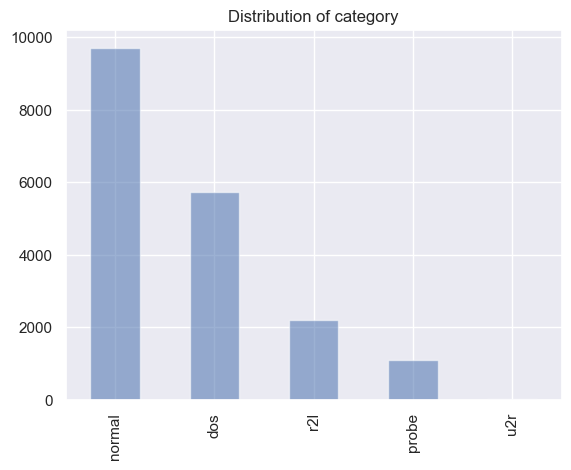

In [24]:
# plots a bar graph of the attack category.
alpha_bar_chart = 0.55
df['class'].value_counts().plot(kind='bar', alpha=alpha_bar_chart)
# puts a title on our graph
plt.title("Distribution of category")

In [25]:
# change catergory data to integers, because some seaborn function only accept integer input.
for attribute in ["protocol_type","service","flag"]:
    le_attribute = preprocessing.LabelEncoder()
    df[attribute] = le_attribute.fit_transform(df[attribute])

/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/seaborn/axisgrid.py:2100: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


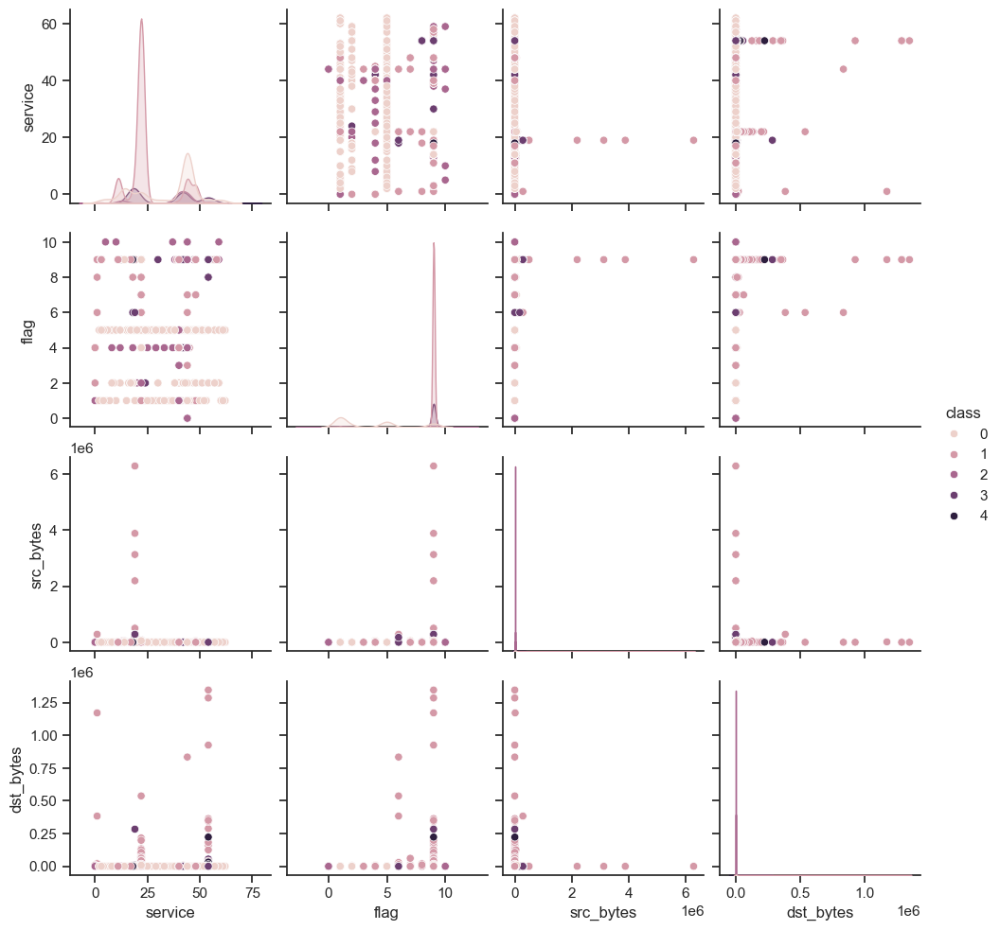

In [36]:
#Plot a scatter graph of pair feature distrubtion
sns.set(style="ticks", color_codes=True)
# Create a Pairplot
pairlot1 = sns.pairplot(df[:], vars=["service", "flag", "src_bytes","dst_bytes"],
                        hue="class", size=2.5)
# pairlot1.savefig("graph/pairlot1.png")

<Figure size 1000x800 with 0 Axes>

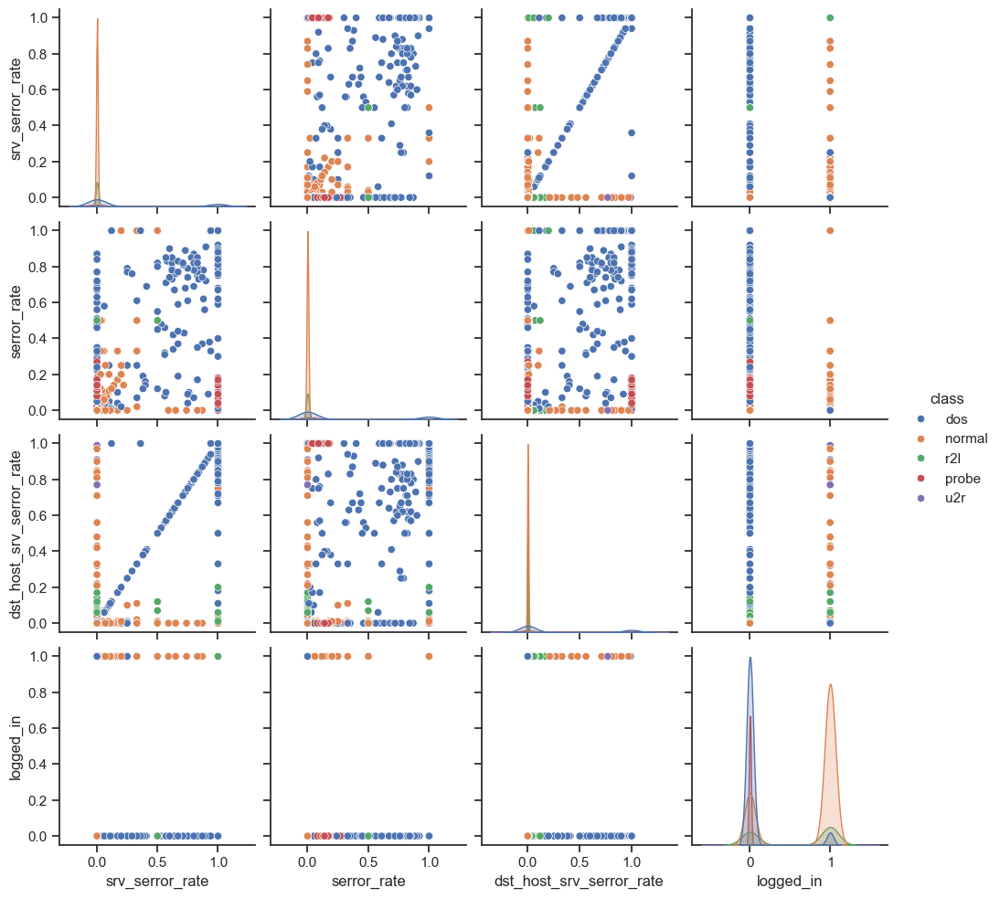

In [27]:
plt.figure(figsize=(10,8))
pairlot2 = sns.pairplot(df[:], vars=["srv_serror_rate", "serror_rate", "dst_host_srv_serror_rate",
                                     "logged_in"], hue="class")
# pairlot2.savefig("graph/pairlot2.png")
plt.show()

/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/seaborn/axisgrid.py:2100: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


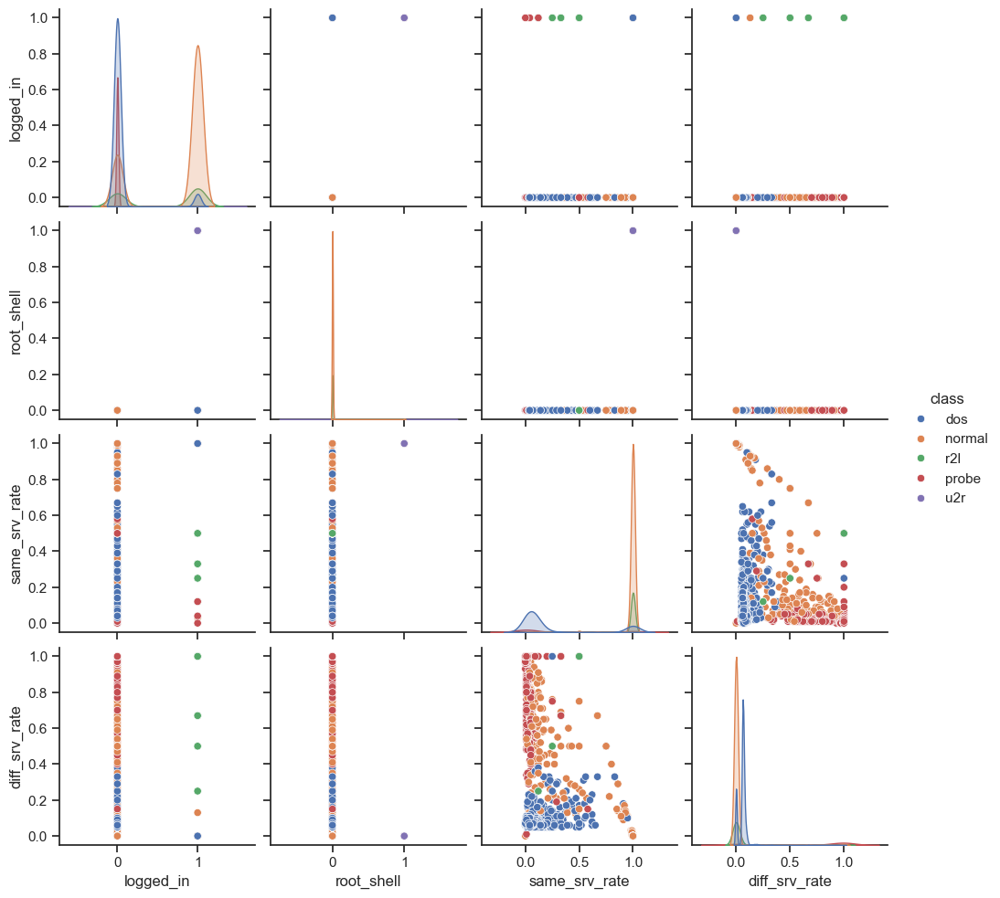

In [28]:
pairlot3 = sns.pairplot(df[:], vars=["logged_in", "root_shell", "same_srv_rate",
                                     "diff_srv_rate"], hue="class", size=2.5)
# pairlot3.savefig("graph/pairlot3.png")

/var/folders/0l/hkmqhf1j0f109scps99rhpbw0000gn/T/ipykernel_11865/2197871035.py:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrplot = sns.heatmap(dff.corr(), annot=False)


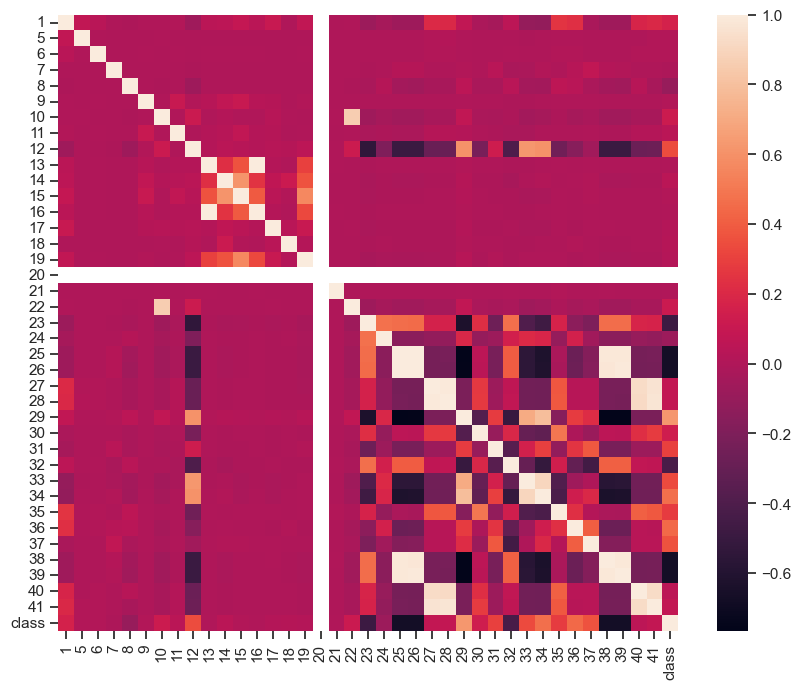

In [29]:
dff = pd.read_csv("data/all/KDDTrain_new _indexFeature.csv")

le_class = preprocessing.LabelEncoder()
dff['class']=le_class.fit_transform(dff['42'])
plt.figure(figsize=(10,8))
corrplot = sns.heatmap(dff.corr(), annot=False)
plt.show()

/var/folders/0l/hkmqhf1j0f109scps99rhpbw0000gn/T/ipykernel_11865/3970607572.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[0:3000].hot, kde=False, rug=True);


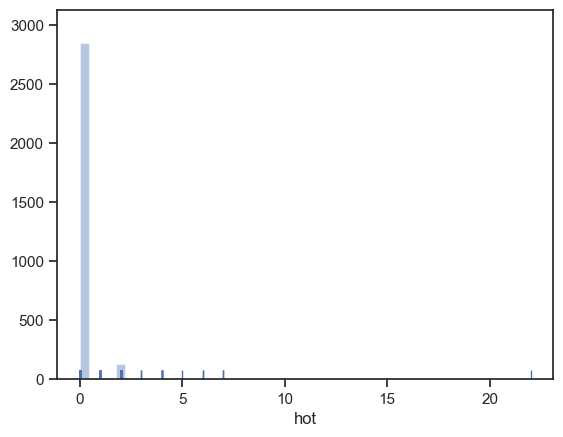

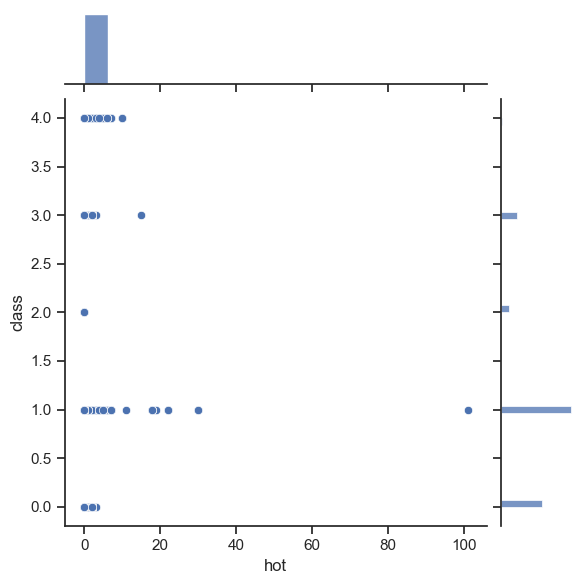

In [30]:
le_class = preprocessing.LabelEncoder()
df['class'] = le_class.fit_transform(df['class'])
sns.distplot(df[0:3000].hot, kde=False, rug=True);
g = sns.jointplot(x="hot", y="class", data=df)

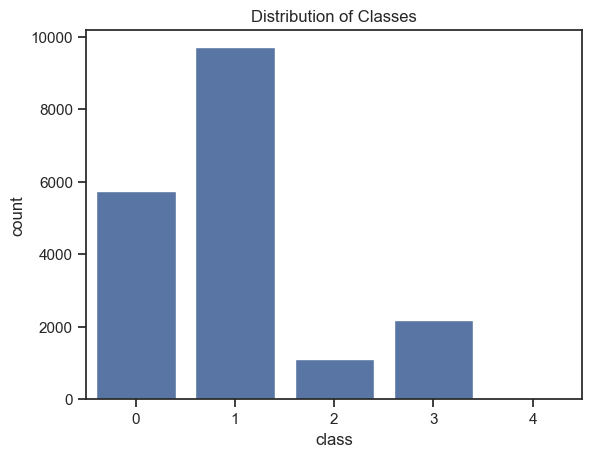

In [31]:
sns.countplot(x='class', data=df)
plt.title('Distribution of Classes')
plt.show()


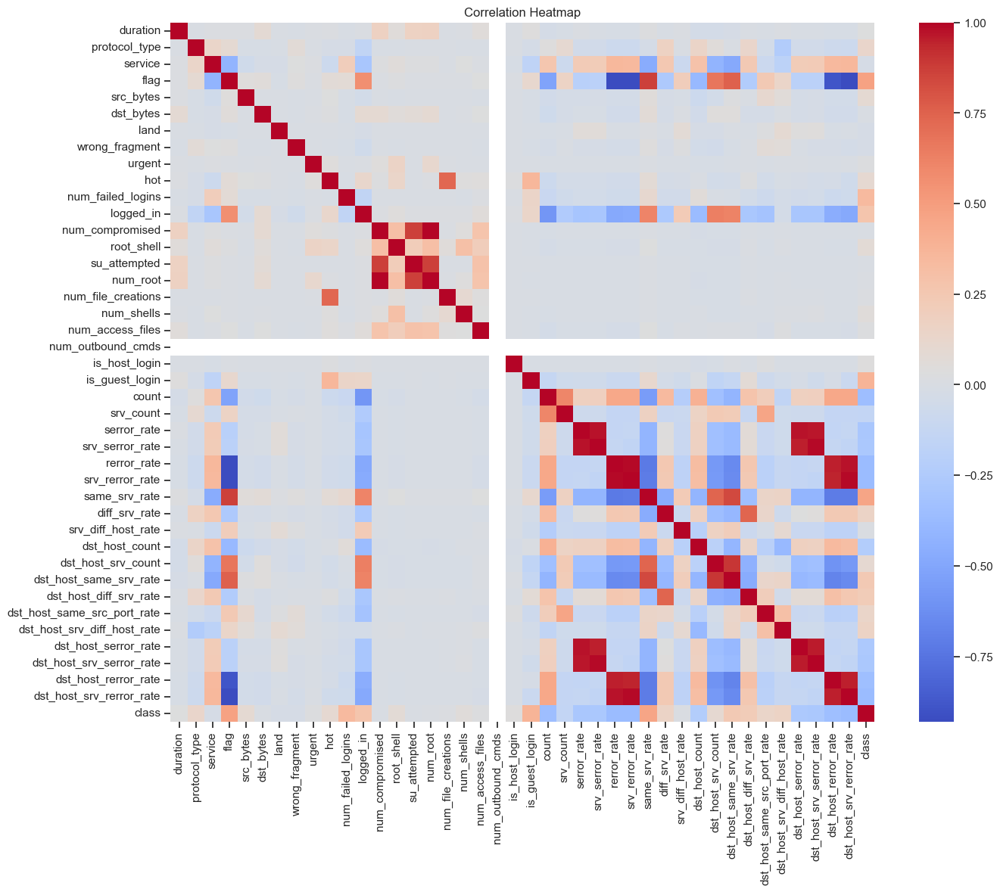

In [32]:
correlation_matrix = df.corr()
plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False)
plt.title('Correlation Heatmap')
plt.show();


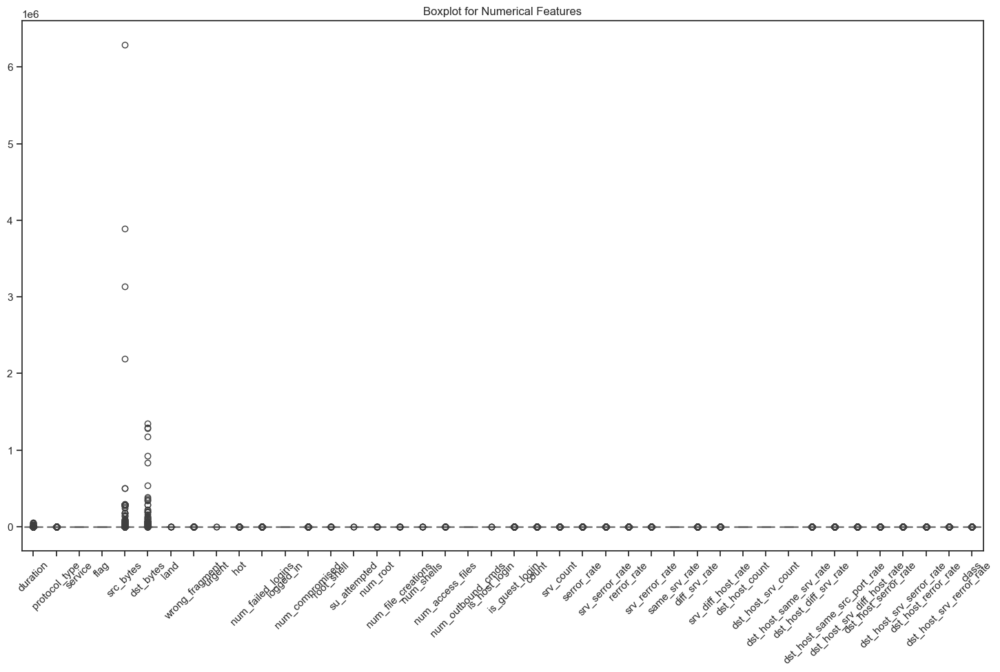

In [33]:
# numerical_features = df.select_dtypes(include=['float64', 'int64']).columns
# plt.figure(figsize=(18, 10))
# sns.boxplot(data=df[numerical_features])
# plt.title('Boxplot for Numerical Features')
# plt.show()
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns
plt.figure(figsize=(18, 10))
sns.boxplot(data=df[numerical_features])
plt.title('Boxplot for Numerical Features')
plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees
plt.show()


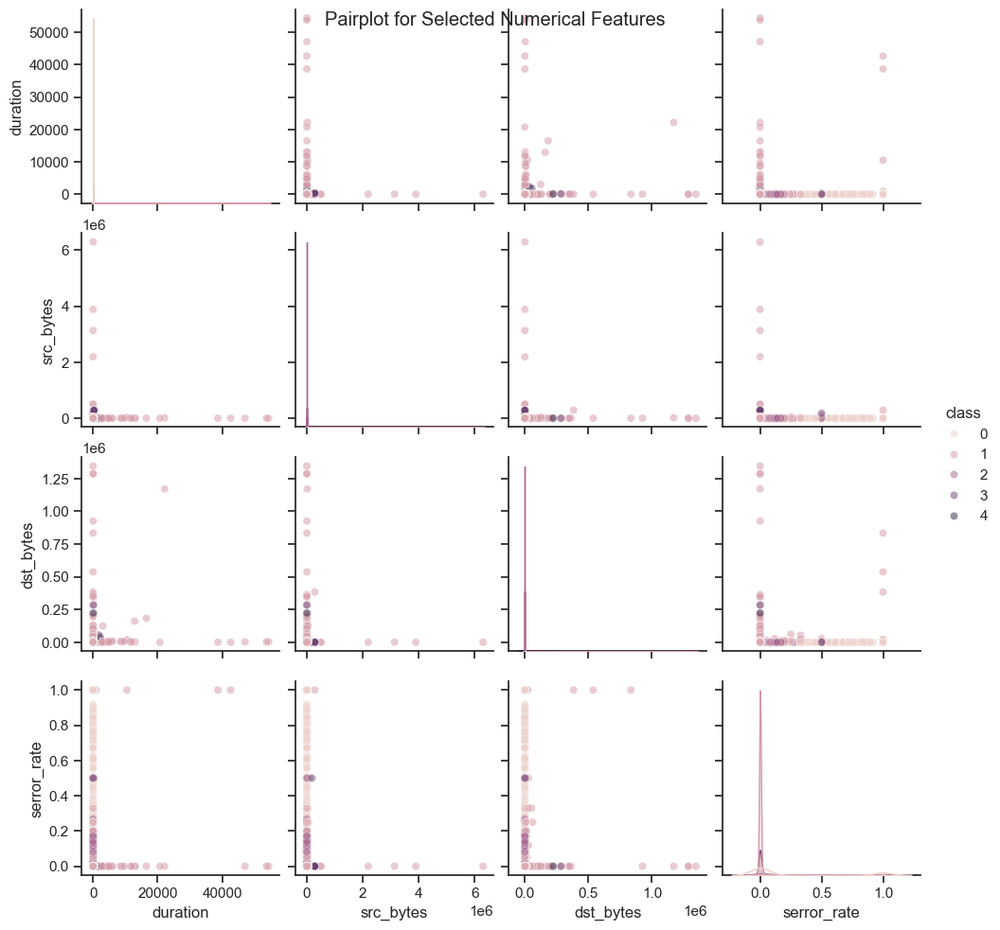

In [34]:
selected_columns = ['duration', 'src_bytes', 'dst_bytes', 'serror_rate', 'class']
sns.pairplot(df[selected_columns], hue='class', plot_kws={'alpha': 0.5})
plt.suptitle('Pairplot for Selected Numerical Features')
plt.show()


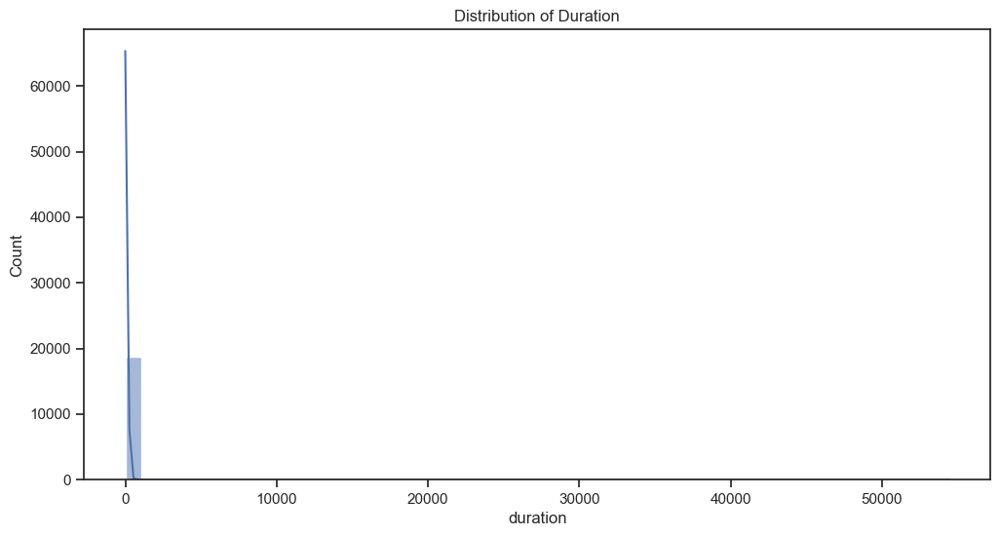

In [35]:
plt.figure(figsize=(12, 6))
sns.histplot(df['duration'], bins=50, kde=True)
plt.title('Distribution of Duration')
plt.show()


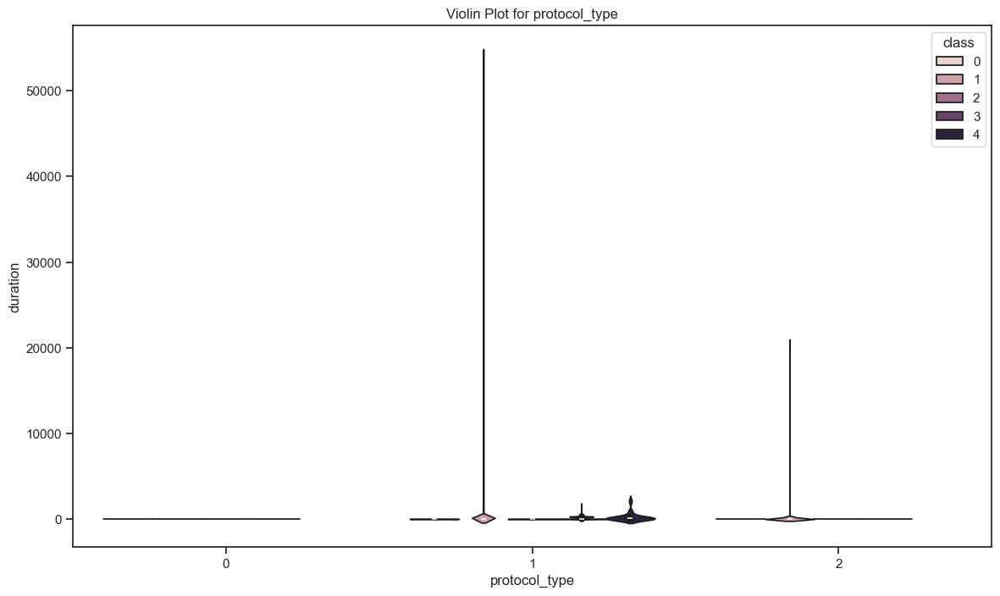

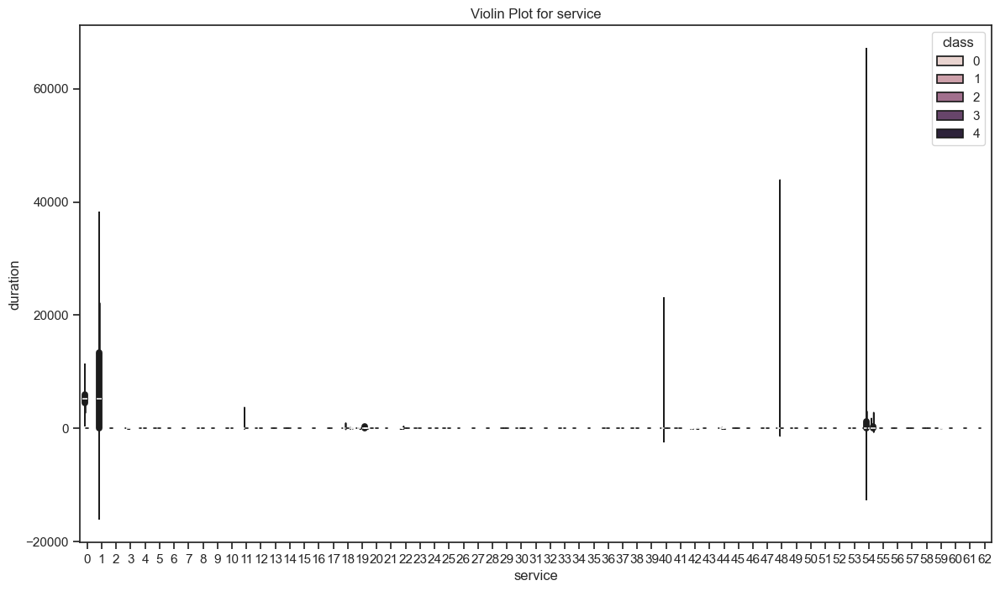

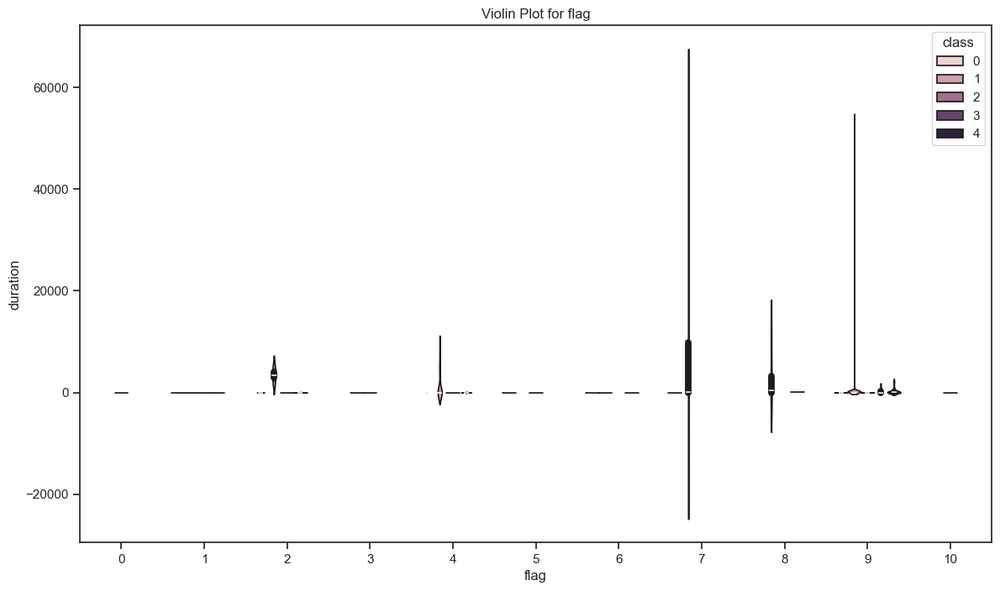

In [37]:
categorical_features = ['protocol_type', 'service', 'flag']
for feature in categorical_features:
    plt.figure(figsize=(14, 8))
    sns.violinplot(x=feature, y='duration', hue='class', data=df)
    plt.title(f'Violin Plot for {feature}')
    plt.show()


In [38]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

# Load your DataFrame
# Assuming df is your DataFrame

# Data preprocessing
label_encoder = LabelEncoder()
df['protocol_type'] = label_encoder.fit_transform(df['protocol_type'])
df['service'] = label_encoder.fit_transform(df['service'])
df['flag'] = label_encoder.fit_transform(df['flag'])
df['class'] = label_encoder.fit_transform(df['class'])

X = df.drop('class', axis=1)
y = to_categorical(df['class'])  # Assuming 'class' is the target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize numerical features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

2023-12-23 15:40:52.874474: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [39]:
y_train.shape[1]


5

In [40]:
X_train.shape[1]

41

In [41]:
# Build the model
model = Sequential()
model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(y_train.shape[1], activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=13, batch_size=32, validation_split=0.25)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy}")

Epoch 1/13
353/353 [==============================] - 2s 2ms/step - loss: 0.3111 - accuracy: 0.9024 - val_loss: 0.1385 - val_accuracy: 0.9561
Epoch 2/13
353/353 [==============================] - 1s 2ms/step - loss: 0.1088 - accuracy: 0.9664 - val_loss: 0.1128 - val_accuracy: 0.9628
Epoch 3/13
353/353 [==============================] - 1s 2ms/step - loss: 0.0815 - accuracy: 0.9748 - val_loss: 0.0932 - val_accuracy: 0.9705
Epoch 4/13
353/353 [==============================] - 1s 2ms/step - loss: 0.0725 - accuracy: 0.9772 - val_loss: 0.0868 - val_accuracy: 0.9731
Epoch 5/13
353/353 [==============================] - 1s 2ms/step - loss: 0.0626 - accuracy: 0.9797 - val_loss: 0.0827 - val_accuracy: 0.9739
Epoch 6/13
353/353 [==============================] - 1s 2ms/step - loss: 0.0561 - accuracy: 0.9816 - val_loss: 0.0785 - val_accuracy: 0.9758
Epoch 7/13
353/353 [==============================] - 1s 2ms/step - loss: 0.0535 - accuracy: 0.9825 - val_loss: 0.0731 - val_accuracy: 0.9771
Epoch 

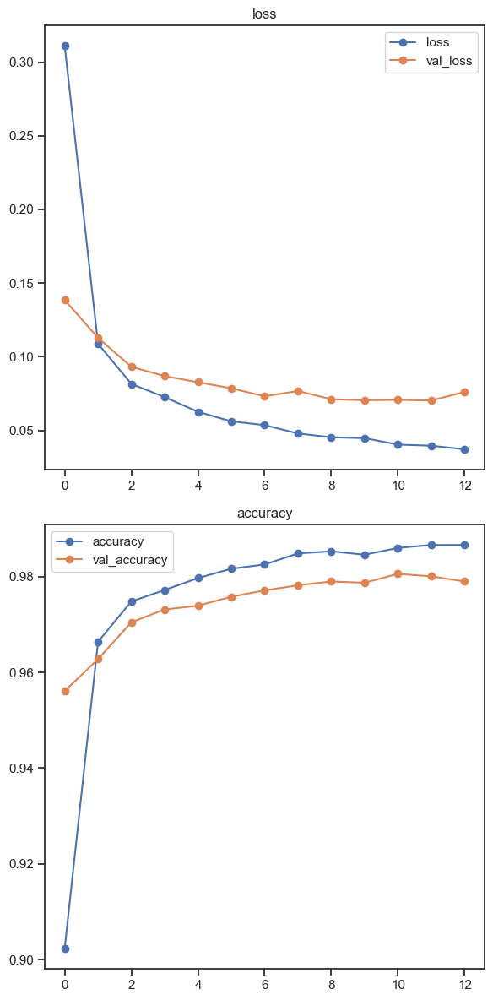

In [42]:
plot_history(history);

In [43]:
df['class'].value_counts()

1    9711
0    5741
3    2199
2    1106
4      37
Name: class, dtype: int64

118/118 [==============================] - 0s 1ms/step


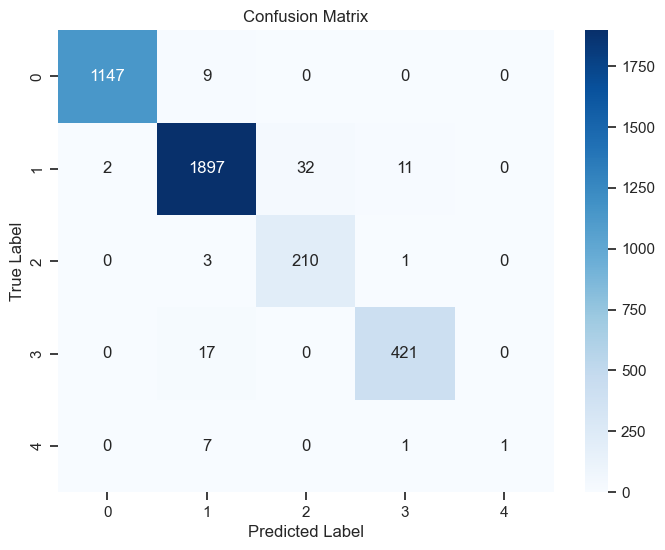

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1156
           1       0.98      0.98      0.98      1942
           2       0.87      0.98      0.92       214
           3       0.97      0.96      0.97       438
           4       1.00      0.11      0.20         9

    accuracy                           0.98      3759
   macro avg       0.96      0.80      0.81      3759
weighted avg       0.98      0.98      0.98      3759



In [44]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'model' is your trained model and 'X_test', 'y_test' are your test data
y_scores = model.predict(X_test)
y_pred = y_scores.argmax(axis=1)
y_true = y_test.argmax(axis=1)

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Convert label_encoder.classes_ to a list of strings
class_labels = list(map(str, label_encoder.classes_))

# Display classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))


/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


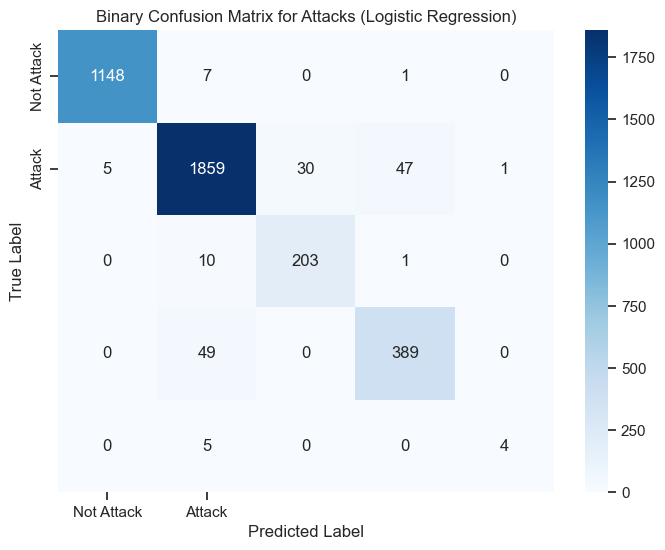

Binary Classification Report (Logistic Regression):
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1156
           1       0.96      0.96      0.96      1942
           2       0.87      0.95      0.91       214
           3       0.89      0.89      0.89       438
           4       0.80      0.44      0.57         9

    accuracy                           0.96      3759
   macro avg       0.90      0.85      0.86      3759
weighted avg       0.96      0.96      0.96      3759



In [45]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'X_train', 'X_test', 'y_train', 'y_test' are your train and test data
# and 'label_encoder' has been defined

# Fit Logistic Regression model
logreg_model = LogisticRegression()
history_logreg = logreg_model.fit(X_train, y_train.argmax(axis=1))

# Predictions on the test set
y_pred_logreg = logreg_model.predict(X_test)

# Create a binary confusion matrix
cm_binary_logreg = confusion_matrix(y_true, y_pred_logreg)

# Display binary confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_binary_logreg, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Attack", "Attack"], yticklabels=["Not Attack", "Attack"])
plt.title("Binary Confusion Matrix for Attacks (Logistic Regression)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Display binary classification report
print("Binary Classification Report (Logistic Regression):")
print(classification_report(y_true, y_pred_logreg, target_names=class_labels))

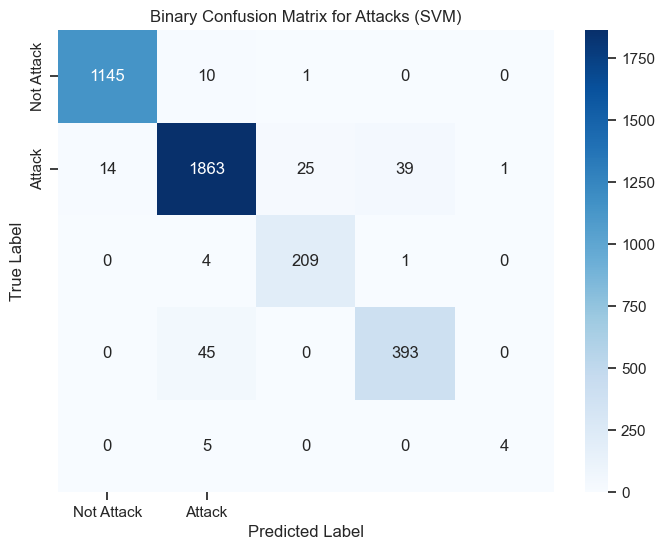

Binary Classification Report (SVM):
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1156
           1       0.97      0.96      0.96      1942
           2       0.89      0.98      0.93       214
           3       0.91      0.90      0.90       438
           4       0.80      0.44      0.57         9

    accuracy                           0.96      3759
   macro avg       0.91      0.85      0.87      3759
weighted avg       0.96      0.96      0.96      3759



In [46]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'X_train', 'X_test', 'y_train', 'y_test' are your train and test data
# and 'label_encoder' has been defined

# Fit SVM model
svm_model = SVC(kernel='linear', probability=True)
history_svm = svm_model.fit(X_train, y_train.argmax(axis=1))

# Predictions on the test set
y_pred_svm = svm_model.predict(X_test)

# Create a binary confusion matrix
cm_binary_svm = confusion_matrix(y_true, y_pred_svm)

# Display binary confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_binary_svm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Attack", "Attack"], yticklabels=["Not Attack", "Attack"])
plt.title("Binary Confusion Matrix for Attacks (SVM)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Display binary classification report
print("Binary Classification Report (SVM):")
print(classification_report(y_true, y_pred_svm, target_names=class_labels))

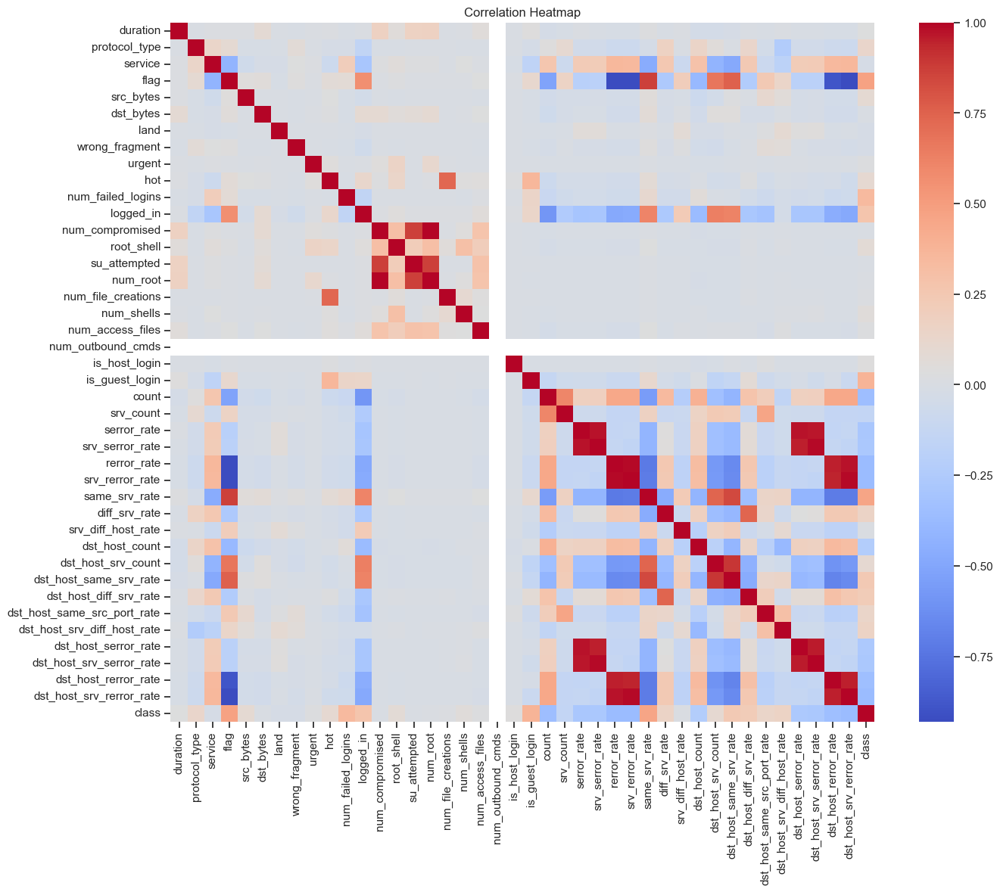

In [47]:
correlation_matrix = df.corr()
plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False)
plt.title('Correlation Heatmap')
plt.show();


In [49]:
str_df = pd.read_csv("data/all/KDDTest_new.csv")
for col in str_df:
    print(f'\n- {col}:')
    print(str_df[col].value_counts())

print(str_df['protocol_type'].value_counts())
print(str_df['service'].value_counts())
print(str_df['flag'].value_counts())



- duration:
0      16846
4        528
282      240
280      216
1        188
       ...  
59         1
91         1
48         1
160        1
112        1
Name: duration, Length: 143, dtype: int64

- protocol_type:
tcp     15757
udp      2095
icmp      942
Name: protocol_type, dtype: int64

- service:
http        7115
private     4210
domain_u     893
ftp_data     839
pop_3        767
            ... 
ntp_u         10
rje            8
tim_i          6
X11            4
tftp_u         1
Name: service, Length: 63, dtype: int64

- flag:
SF        13276
REJ        3232
S0         1582
RSTO        408
RSTR        183
SH           73
S1           16
S2           10
S3            8
OTH           4
RSTOS0        2
Name: flag, dtype: int64

- src_bytes:
0        5493
1         439
54540     325
1032      311
44        265
         ... 
1441        1
2664        1
77332       1
1824        1
794         1
Name: src_bytes, Length: 1034, dtype: int64

- dst_bytes:
0       7418
93       708
174    

In [50]:
str_df

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,class
0,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,229,10,0.0,0.0,1.0,1.0,0.04,0.06,0.00,255,10,0.04,0.06,0.00,0.00,0.00,0.0,1.00,1.00,dos
1,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,136,1,0.0,0.0,1.0,1.0,0.01,0.06,0.00,255,1,0.00,0.06,0.00,0.00,0.00,0.0,1.00,1.00,dos
2,2,tcp,ftp_data,SF,12983,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.0,0.0,0.0,1.00,0.00,0.00,134,86,0.61,0.04,0.61,0.02,0.00,0.0,0.00,0.00,normal
3,0,tcp,http,SF,267,14515,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4,4,0.0,0.0,0.0,0.0,1.00,0.00,0.00,155,255,1.00,0.00,0.01,0.03,0.01,0.0,0.00,0.00,normal
4,0,tcp,smtp,SF,1022,387,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,3,0.0,0.0,0.0,0.0,1.00,0.00,1.00,255,28,0.11,0.72,0.00,0.00,0.00,0.0,0.72,0.04,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18789,0,icmp,ecr_i,SF,1032,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,53,53,0.0,0.0,0.0,0.0,1.00,0.00,0.00,255,255,1.00,0.00,1.00,0.00,0.00,0.0,0.00,0.00,dos
18790,0,tcp,smtp,SF,794,333,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.0,0.0,0.0,1.00,0.00,0.00,100,141,0.72,0.06,0.01,0.01,0.01,0.0,0.00,0.00,normal
18791,0,tcp,http,SF,317,938,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,11,0.0,0.0,0.0,0.0,1.00,0.00,0.18,197,255,1.00,0.00,0.01,0.01,0.01,0.0,0.00,0.00,normal
18792,0,tcp,http,SF,54540,8314,0,0,0,2,0,1,1,0,0,0,0,0,0,0,0,0,5,10,0.0,0.0,0.0,0.0,1.00,0.00,0.20,255,255,1.00,0.00,0.00,0.00,0.00,0.0,0.07,0.07,dos


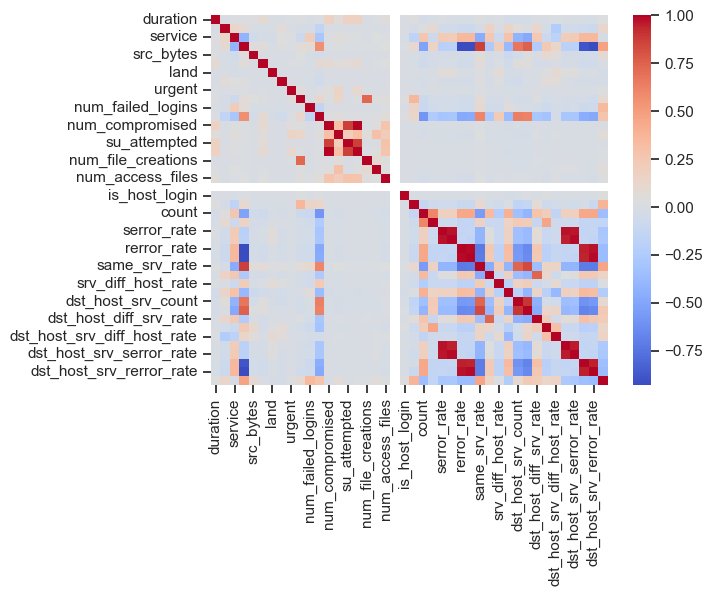

In [51]:
# Define X and y
target = "class"
X = df.drop(columns = [target])
y = df[target]

# Instantiate Standard Scaler
scaler = StandardScaler()
# Fit & transform data.
scaled_df = scaler.fit_transform(X)
# Calculating the correlation matrix and plotting
# corr = scaled_df.corr()
sns.heatmap(df.corr(), cmap='coolwarm');



/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/pandas/plotting/_matplotlib/misc.py:101: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[j])
/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/pandas/plotting/_matplotlib/misc.py:102: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(boundaries_list[i])
/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/pandas/plotting/_matplotlib/misc.py:92: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[i])


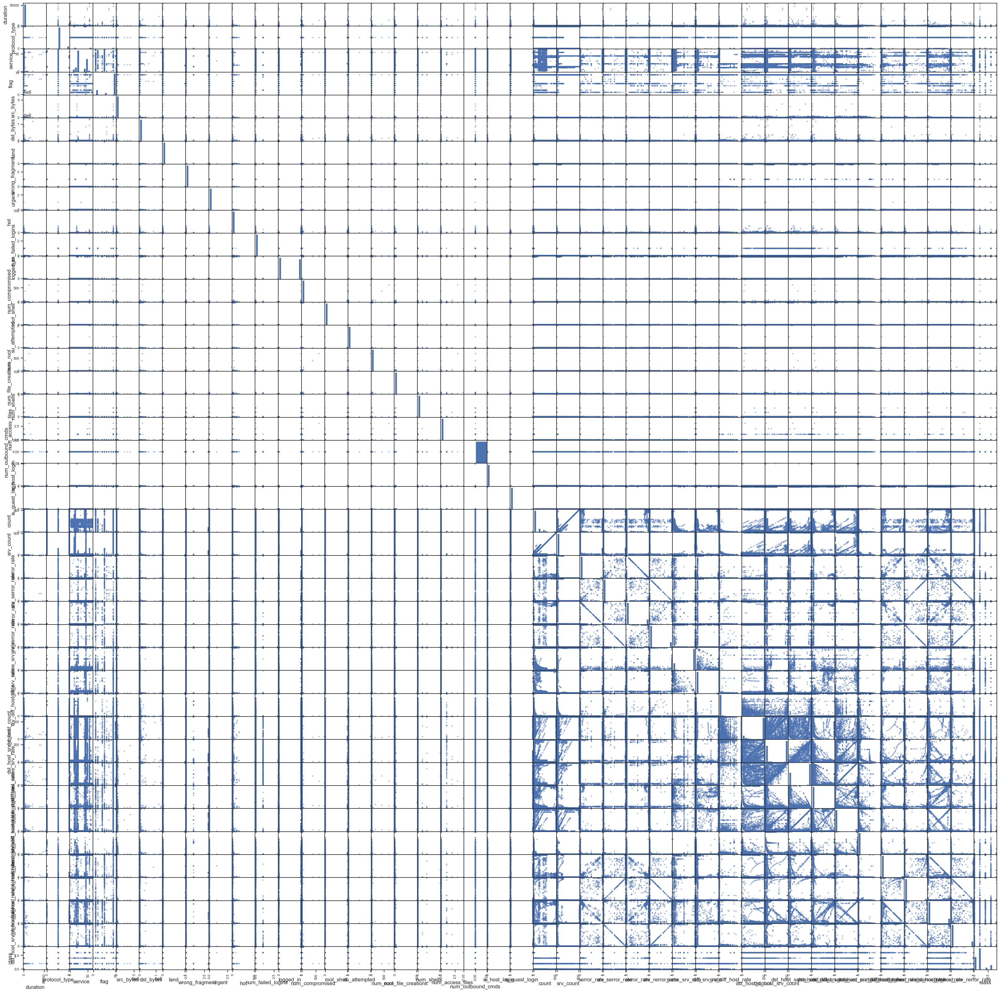

In [52]:
# Creating a scatter_matrix with pandas
pd.plotting.scatter_matrix(df, figsize=(40,40));



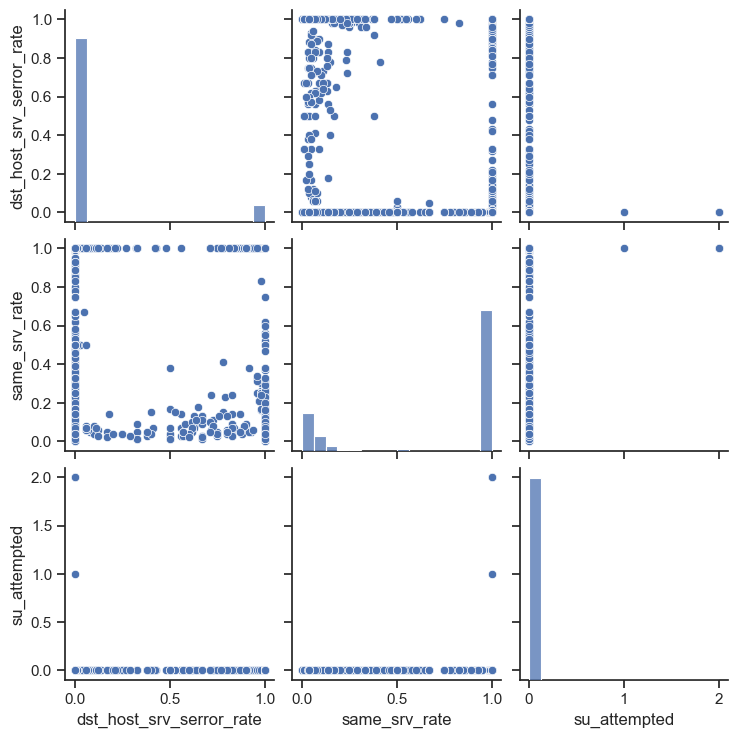

In [53]:
# randomly select features to plot
np.random.seed(42)
random_features = np.random.choice(df.columns,3)
# plot thee randomly selected features
sns.pairplot(df,  vars=random_features);



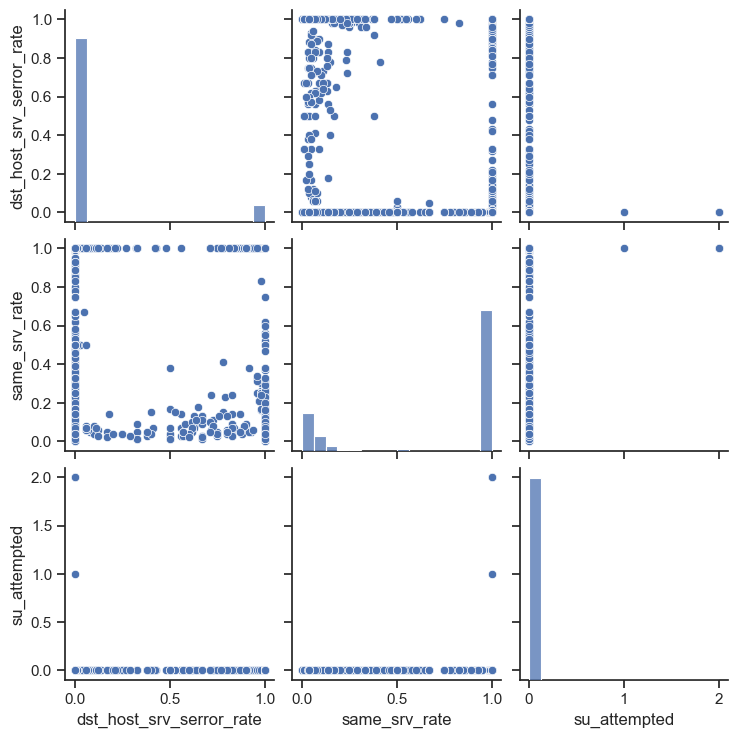

In [54]:
# randomly select features to plot
np.random.seed(42)
random_features = np.random.choice(df.columns,3)
# plot thee randomly selected features
sns.pairplot(df,  vars=random_features);



In [ ]:
# # Concatenate scaled features with target
# plot_df = pd.concat([str_df, str_df[target]], axis=1)
# # Plot with color coding based on target
# g = sns.pairplot(data=plot_df,  vars=random_features, hue='class')
# g.fig.suptitle('Visualizing Raw Features - Colored by Training', y=1.01);

In [55]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler,OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn import set_config
set_config(transform_output='pandas')
pd.set_option('display.max_columns',100)

# Instantiate PCA to make 3 principal components
pca = PCA(n_components=3)
# Create and define the principal components
principal_components = pca.fit_transform(scaled_df)
# Preview the results
principal_components.head()



,pca0,pca1,pca2
0,4.900654,-2.049858,0.012283
1,4.828042,-2.042551,0.039950
2,-1.249720,-0.063951,-0.108781
3,-2.294666,-0.311855,-0.027256
4,0.041498,-0.470938,0.111627


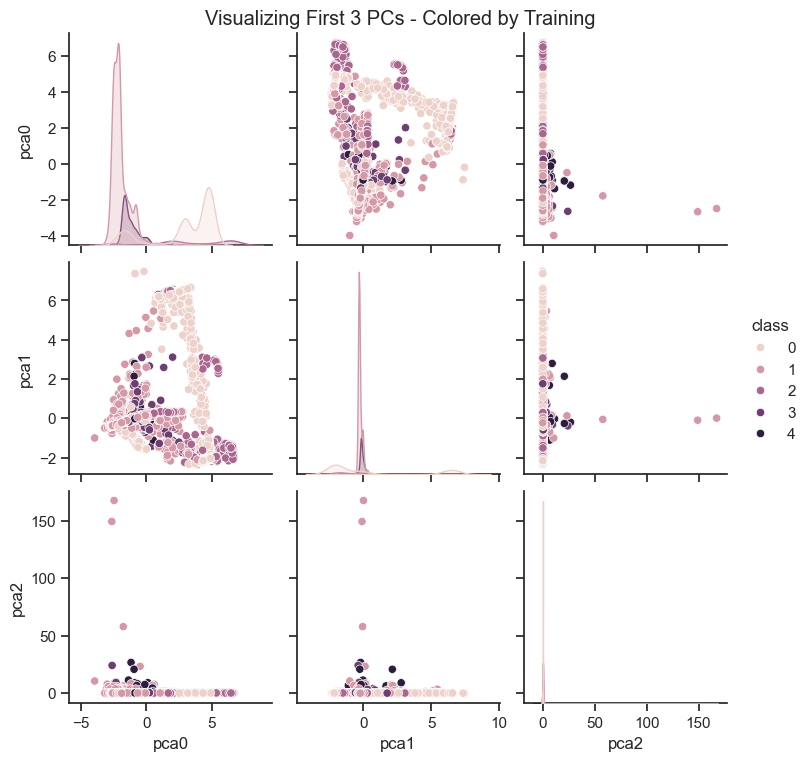

In [56]:
# Concatenate principal components with target
plot_df_pca = pd.concat([principal_components, df[target]], axis=1)
# Plot with color coding based on target
g_pca = sns.pairplot(data=plot_df_pca,  vars=principal_components.columns, hue='class')
g_pca.fig.suptitle('Visualizing First 3 PCs - Colored by Training', y=1.01);



In [60]:
import plotly.express as px
import plotly.io as pio
# Make a 3d scatter plot with a PC on each axis and color by the target
fig = px.scatter_3d(plot_df_pca, x='pca0',y='pca1',z='pca2', width=800, height=600, color = "class")
fig



In [61]:
def update_scatter3d(fig):
    fig.update_traces({'marker':{'size':3}})
    fig.show(config={'scrollZoom':False})
update_scatter3d(fig)



In [62]:
# Make a 3d scatter plot with a PC on each axis and color by the target
# Change template style to plotly_dark
fig = px.scatter_3d(plot_df_pca, x='pca0',y='pca1',z='pca2', width=800, height=600, color = "class", template = 'plotly_dark')
update_scatter3d(fig)


In [63]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

pd.set_option('display.max_columns',200)
pd.set_option("display.max_info_rows", 800)
pd.set_option('display.max_info_columns',800)

from sklearn import set_config
set_config(transform_output='pandas')


In [64]:
X_train,X_test,y_train,y_test = train_test_split(X,y, random_state=321)
X_train.head()



,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
5923,0,1,44,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,230,6,0.0,0.0,1.0,1.0,0.03,0.06,0.0,255,6,0.02,0.07,0.00,0.00,0.00,0.0,1.00,1.0
13290,0,1,22,9,221,295,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.0,0.0,0.0,0.0,1.00,0.00,0.0,5,255,1.00,0.00,0.20,0.04,0.00,0.0,0.00,0.0
4596,0,1,19,9,10389,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,5,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,11,0.04,0.02,0.04,0.00,0.00,0.0,0.02,0.0
10570,0,1,19,9,373,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.0,133,121,0.63,0.03,0.63,0.02,0.01,0.0,0.01,0.0
14200,0,1,19,9,12,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.0,2,20,1.00,0.00,1.00,0.20,0.00,0.0,0.00,0.0


In [65]:
X_train,X_test,y_train,y_test = train_test_split(X,y, random_state=321)
X_train.head()



,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
5923,0,1,44,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,230,6,0.0,0.0,1.0,1.0,0.03,0.06,0.0,255,6,0.02,0.07,0.00,0.00,0.00,0.0,1.00,1.0
13290,0,1,22,9,221,295,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.0,0.0,0.0,0.0,1.00,0.00,0.0,5,255,1.00,0.00,0.20,0.04,0.00,0.0,0.00,0.0
4596,0,1,19,9,10389,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,5,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,11,0.04,0.02,0.04,0.00,0.00,0.0,0.02,0.0
10570,0,1,19,9,373,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.0,133,121,0.63,0.03,0.63,0.02,0.01,0.0,0.01,0.0
14200,0,1,19,9,12,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.0,2,20,1.00,0.00,1.00,0.20,0.00,0.0,0.00,0.0


In [66]:
# Instantiate Standard Scaler
scaler = StandardScaler()
# Fit & transform data.
X_train_tf = scaler.fit_transform(X_train)
X_test_tf = scaler.transform(X_test)



In [67]:
# Check for class balance of target
y_train.value_counts(1)



1    0.511955
0    0.308265
3    0.117488
2    0.060021
4    0.002270
Name: class, dtype: float64

In [79]:
from imblearn.over_sampling import SMOTE,SMOTENC
smote = SMOTE()
X_train_sm, y_train_sm = smote.fit_resample(X_train_tf, y_train)
y_train_sm.value_counts()



0    7216
1    7216
3    7216
2    7216
4    7216
Name: class, dtype: int64

In [81]:
# Instantiate & fit data using PCA
pca = PCA(n_components=3)
X_train_pca = pca.fit_transform(X_train_sm)
X_test_pca = pca.transform(X_test_tf)
X_train_pca.head()



,pca0,pca1,pca2
0,-2.482576,-0.676593,0.749313
1,-2.215717,-0.505654,0.518869
2,-2.241515,-0.533881,0.489178
3,-2.320491,-0.568967,0.591375
4,-2.345389,-0.620305,0.724248


In [83]:
# Compare speeds before and after PCA
compare_speed = dur_baseline/dur_pca
print(f"Using PCs was {compare_speed:.2f} times faster!")



Using PCs was 0.80 times faster!


In [84]:
# Initialize and fit PCA
pca = PCA()
pca.fit(X_train_sm, y_train)



PCA()

In [85]:
# Determine how much variance is explained by each PC
explained = pd.Series(pca.explained_variance_ratio_, name='Explained Variance Ratio')
explained



0     3.785064e-01
1     1.894143e-01
2     1.250426e-01
3     6.724246e-02
4     5.464587e-02
5     2.672972e-02
6     2.311739e-02
7     2.238867e-02
8     1.788998e-02
9     1.233319e-02
10    1.172834e-02
11    7.705746e-03
12    7.348964e-03
13    6.780516e-03
14    6.197319e-03
15    5.135612e-03
16    4.698311e-03
17    3.869793e-03
18    3.409304e-03
19    3.306276e-03
20    3.019248e-03
21    2.770069e-03
22    2.752941e-03
23    2.570868e-03
24    2.247979e-03
25    2.203755e-03
26    1.853670e-03
27    1.294600e-03
28    8.263020e-04
29    6.156253e-04
30    5.168983e-04
31    4.919213e-04
32    3.988178e-04
33    3.420633e-04
34    2.379093e-04
35    1.700849e-04
36    9.930671e-05
37    6.521657e-05
38    1.701072e-05
39    1.497530e-05
40    2.785212e-33
Name: Explained Variance Ratio, dtype: float64

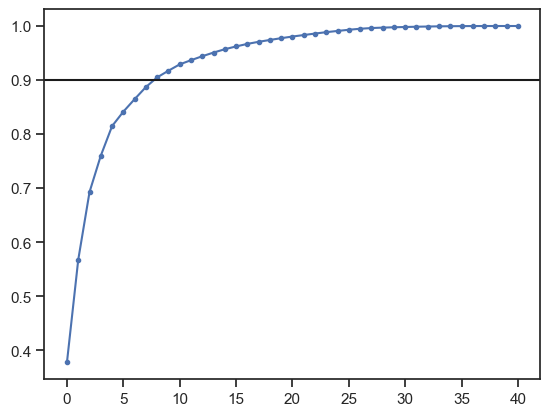

In [86]:
# plot the cumulative sum of the percentage of explained variance for each component and those before it.
ax = explained.cumsum().plot(marker='.')
# add a line to mark .9 (or 90%) variance explained
ax.axhline(.9, color='k');



In [87]:
# Define PCA to address 85% of the variance
pca85 = PCA(n_components=.85)
# fit and transform on training data
X_train_pca85 = pca85.fit_transform(X_train_sm)
# transform test data
X_test_pca85 = pca85.transform(X_test_tf)
# obtain the number of PCs used
pca85.n_components_



7

In [95]:
compare_speed = dur_baseline/dur_pca_85
print(f"Using PC's with .85 was {compare_speed:.2f} times faster!")



Using PC's with .85 was 0.51 times faster!


In [96]:
# Copy of dataframe just for visualization and EDA
temp_df = df.copy()



In [97]:
# Add **kwargs as keyword when defining function
# Include **kwargs in the sns.regplot() within the function

def plot_numeric_vs_target(df, x, y, figsize=(6,4), **kwargs): # kwargs for sns.regplot
  # Calculate the correlation
  corr = df[[x,y]].corr().round(2)
  r = corr.loc[x,y]
  # Plot the data
  fig, ax = plt.subplots(figsize=figsize)
  scatter_kws={'ec':'white','lw':1,'alpha':0.8}
  sns.regplot(data=df, x=x, y=y, ax=ax, scatter_kws=scatter_kws, **kwargs) # Included the new argument within the sns.regplot function
  ## Add the title with the correlation
  ax.set_title(f"{x} vs. {y} (r = {r})")
  # Make sure the plot is shown before the print statement
  plt.show()
  return fig, ax





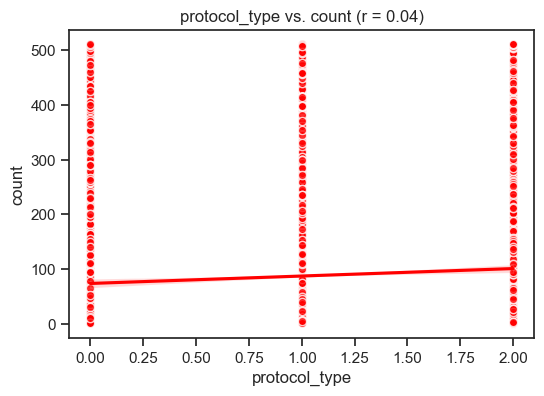

In [99]:
# Test the function with a kwarg from the regplot function
fig, ax = plot_numeric_vs_target(df, "protocol_type",'count', color = 'red')

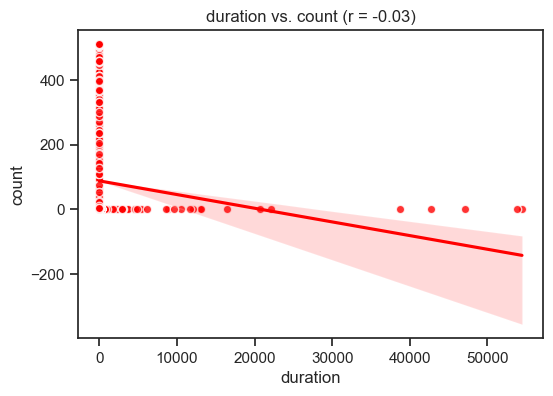

In [100]:
# Test the function with a kwarg from the regplot function
fig, ax = plot_numeric_vs_target(df, "duration",'count', color = 'red')

In [101]:
# Final version of function
def plot_categorical_vs_target(df, x, y='SalePrice',figsize=(6,4),
                            fillna = True, placeholder = 'MISSING',
                            order = None):
  # Make a copy of the dataframe and fillna
  temp_df = df.copy()
  # fillna with placeholder
  if fillna == True:
    temp_df[x] = temp_df[x].fillna(placeholder)

  # or drop nulls prevent unwanted 'nan' group in stripplot
  else:
    temp_df = temp_df.dropna(subset=[x])
  # Create the figure and subplots
  fig, ax = plt.subplots(figsize=figsize)

    # Barplot
  sns.barplot(data=temp_df, x=x, y=y, ax=ax, order=order, alpha=0.6,
              linewidth=1, edgecolor='black', errorbar=None)

  # Boxplot
  sns.stripplot(data=temp_df, x=x, y=y, hue=x, ax=ax,
                order=order, hue_order=order, legend=False,
                edgecolor='white', linewidth=0.5,
                size=3,zorder=0)
  # Rotate xlabels
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

  # Add a title
  ax.set_title(f"{x} vs. {y}")
  fig.tight_layout()
  return fig, ax

# # Test with an order argument
# fig, ax = plot_categorical_vs_target(df, x='Exter Qual', fillna=False,
#                                   order=qual_order)



# Resampling Techniques:
## Oversampling:
* Duplicate examples from the minority class.
* Use RandomOverSampler from the imbalanced-learn library.

In [106]:
df = pd.read_csv("data/all/KDDTest_new.csv")

# Data preprocessing
label_encoder = LabelEncoder()
df['protocol_type'] = label_encoder.fit_transform(df['protocol_type'])
df['service'] = label_encoder.fit_transform(df['service'])
df['flag'] = label_encoder.fit_transform(df['flag'])
df['class'] = label_encoder.fit_transform(df['class'])

X = df.drop('class', axis=1)
y = to_categorical(df['class'])  # Assuming 'class' is the target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize numerical features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [107]:
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler(random_state=42)
X_resampled_over, y_resampled_over = ros.fit_resample(X, y)
X_train_resampled_over, X_test_resampled_over, y_train_resampled_over, y_test_resampled_over = train_test_split(X_resampled_over, y_resampled_over, test_size=0.25, random_state=42)

In [108]:
print(X_train_resampled_over.shape)
print(y_train_resampled_over.shape)
# print(y_train_resampled_over.value_counts())
X_train_resampled_over

(36416, 41)
(36416, 5)


,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
47139,10,1,19,9,256000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,51,0.20,0.03,0.20,0.00,0.29,0.0,0.02,0.0
13238,0,0,13,9,18,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.0,0.0,0.0,1.00,0.00,0.0,1,4,1.00,0.00,1.00,1.00,0.00,0.0,0.00,0.0
5081,0,1,54,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,49,49,1.0,1.0,0.0,0.0,1.00,0.00,0.0,61,49,0.80,0.03,0.02,0.00,0.80,1.0,0.00,0.0
8201,0,2,44,9,52,53,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,511,511,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,255,1.00,0.00,0.78,0.00,0.00,0.0,0.00,0.0
13226,281,1,18,9,162,599,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0.0,0.0,0.0,0.0,1.00,0.00,0.0,219,108,0.49,0.03,0.00,0.00,0.00,0.0,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,0,1,22,9,164,10312,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,6,6,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,255,1.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0
44732,84,1,54,9,2742,5433,0,0,0,6,0,1,5,1,0,1,1,1,0,0,0,0,1,1,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,1,0.00,0.01,0.00,0.00,0.00,0.0,0.00,0.0
38158,5,1,42,9,28,93,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.0,0.0,0.0,1.00,0.00,0.0,175,157,0.89,0.02,0.01,0.01,0.00,0.0,0.06,0.0
860,0,1,27,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,141,15,0.0,0.0,1.0,1.0,0.11,0.06,0.0,255,15,0.06,0.05,0.00,0.00,0.00,0.0,1.00,1.0


In [111]:
from tensorflow.keras.layers import Dropout

## Deep Learning Model with Oversampling

In [118]:

model_over = Sequential()
model_over.add(Dense(64, input_dim=X_train_resampled_over.shape[1], activation='relu'))
model_over.add(Dropout(0.2))
model_over.add(Dense(32, activation='relu'))
model_over.add(Dropout(0.6))
model_over.add(Dense(y_train_resampled_over.shape[1], activation='softmax'))

# Compile the model
model_over.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history_over = model.fit(X_train_resampled_over, y_train_resampled_over, epochs=60, batch_size=32, validation_split=0.25)

# Evaluate the model
loss, accuracy = model_over.evaluate(X_test_resampled_over, y_test_resampled_over)
print(f"Test Accuracy: {accuracy}")

Epoch 1/60
854/854 [==============================] - 1s 2ms/step - loss: 0.1189 - accuracy: 0.9566 - val_loss: 0.0909 - val_accuracy: 0.9641
Epoch 2/60
854/854 [==============================] - 1s 2ms/step - loss: 0.1188 - accuracy: 0.9634 - val_loss: 0.1036 - val_accuracy: 0.9629
Epoch 3/60
854/854 [==============================] - 1s 2ms/step - loss: 0.1045 - accuracy: 0.9595 - val_loss: 0.1600 - val_accuracy: 0.9494
Epoch 4/60
854/854 [==============================] - 1s 2ms/step - loss: 0.1390 - accuracy: 0.9524 - val_loss: 0.1288 - val_accuracy: 0.9527
Epoch 5/60
854/854 [==============================] - 1s 2ms/step - loss: 0.1519 - accuracy: 0.9454 - val_loss: 0.1471 - val_accuracy: 0.9468
Epoch 6/60
854/854 [==============================] - 1s 2ms/step - loss: 0.1342 - accuracy: 0.9486 - val_loss: 0.1295 - val_accuracy: 0.9530
Epoch 7/60
854/854 [==============================] - 1s 2ms/step - loss: 0.1181 - accuracy: 0.9542 - val_loss: 0.1762 - val_accuracy: 0.9540
Epoch 

854/854 [==============================] - 1s 2ms/step - loss: 0.0908 - accuracy: 0.9672 - val_loss: 0.0793 - val_accuracy: 0.9663
Epoch 59/60
854/854 [==============================] - 1s 2ms/step - loss: 0.0826 - accuracy: 0.9684 - val_loss: 0.0831 - val_accuracy: 0.9677
Epoch 60/60
380/380 [==============================] - 1s 1ms/step - loss: 456.6089 - accuracy: 0.0865
Test Accuracy: 0.08649806678295135


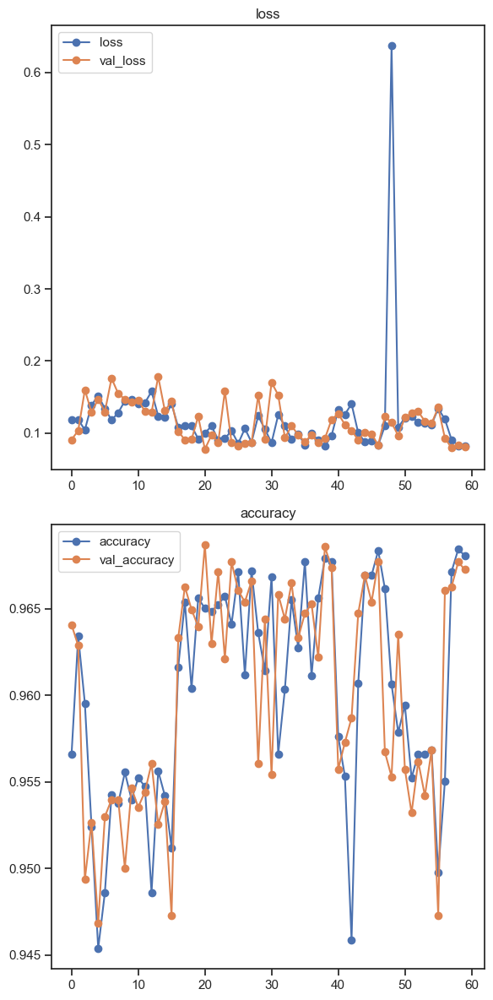

In [119]:
# Call custom function to plot metrics
plot_history(history_over);

In [120]:
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def classification_metrics(y_true, y_pred, label='',
                           output_dict=False, figsize=(8,4),
                           normalize='true', cmap='Blues',
                           colorbar=False):

    # Get the classification report
    report = classification_report(y_true, y_pred)
    ## Print header and report
    header = "-"*70
    print(header, f" Classification Metrics: {label}", header, sep='\n')
    print(report)

    ## CONFUSION MATRICES SUBPLOTS
    fig, axes = plt.subplots(ncols=2, figsize=figsize)

    # create a confusion matrix  of raw counts
    ConfusionMatrixDisplay.from_predictions(y_true, y_pred,
                normalize=None, cmap='gist_gray', values_format="d", colorbar=colorbar,
                ax = axes[0],);
    axes[0].set_title("Raw Counts")

    # create a confusion matrix with the test data
    ConfusionMatrixDisplay.from_predictions(y_true, y_pred,
                normalize=normalize, cmap=cmap, values_format=".2f", colorbar=colorbar,
                ax = axes[1]);
    axes[1].set_title("Normalized Confusion Matrix")

    # Adjust layout and show figure
    fig.tight_layout()
    plt.show()

    # Return dictionary of classification_report
    if output_dict==True:
        report_dict = classification_report(y_true, y_pred, output_dict=True)
        return report_dict


380/380 [==============================] - 0s 1ms/step


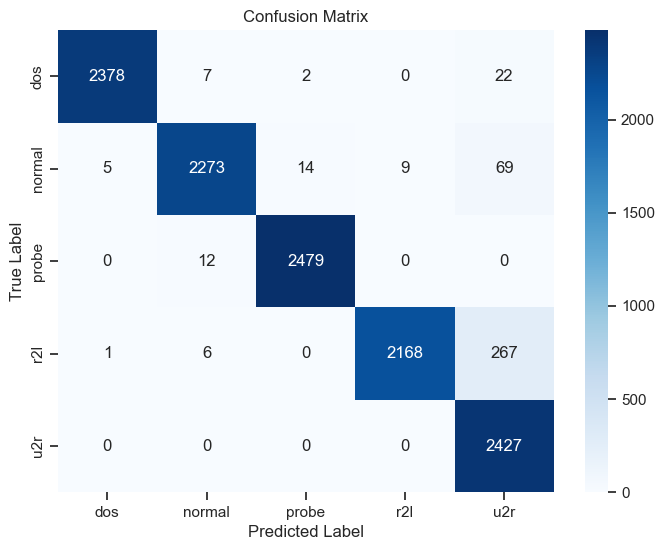

Classification Report:
              precision    recall  f1-score   support

         dos       1.00      0.99      0.99      2409
      normal       0.99      0.96      0.97      2370
       probe       0.99      1.00      0.99      2491
         r2l       1.00      0.89      0.94      2442
         u2r       0.87      1.00      0.93      2427

    accuracy                           0.97     12139
   macro avg       0.97      0.97      0.97     12139
weighted avg       0.97      0.97      0.97     12139



In [123]:
y_scores = model.predict(X_test_resampled_over)
y_pred = y_scores.argmax(axis=1)
y_true = y_test_resampled_over.argmax(axis=1)

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Convert label_encoder.classes_ to a list of strings
class_labels = list(map(str, label_encoder.classes_))

# Display classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))


----------------------------------------------------------------------
 Classification Metrics: 
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      2409
           1       0.99      0.96      0.97      2370
           2       0.99      1.00      0.99      2491
           3       1.00      0.89      0.94      2442
           4       0.87      1.00      0.93      2427

    accuracy                           0.97     12139
   macro avg       0.97      0.97      0.97     12139
weighted avg       0.97      0.97      0.97     12139



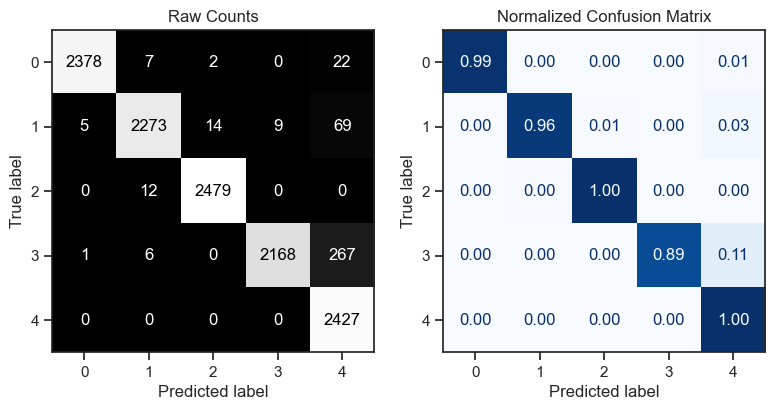

In [124]:
classification_metrics(y_true, y_pred)

1138/1138 [==============================] - 1s 1ms/step
----------------------------------------------------------------------
 Classification Metrics: 
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      7302
           1       0.99      0.96      0.98      7341
           2       1.00      0.99      1.00      7220
           3       0.99      0.89      0.94      7269
           4       0.88      1.00      0.94      7284

    accuracy                           0.97     36416
   macro avg       0.97      0.97      0.97     36416
weighted avg       0.97      0.97      0.97     36416



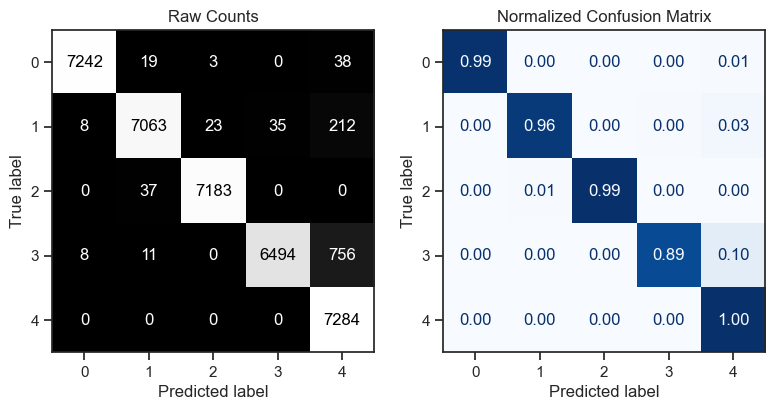

In [125]:
y_scores = model.predict(X_train_resampled_over)
y_pred = y_scores.argmax(axis=1)
y_true = y_train_resampled_over.argmax(axis=1)
classification_metrics(y_true, y_pred)

## Undersampling:
* Remove examples from the majority class.
* Use RandomUnderSampler from the imbalanced-learn library.

In [126]:
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler(random_state=42)
X_resampled_under, y_resampled_under = rus.fit_resample(X, y)
X_train_resampled_under, X_test_resampled_under, y_train_resampled_under, y_test_resampled_under = train_test_split(X_resampled_under, y_resampled_under, test_size=0.25, random_state=42)

In [168]:
model_under = Sequential()
model_under.add(Dense(64, input_dim=X_train_resampled_under.shape[1], activation='relu'))
model_under.add(Dropout(0.3))
model_under.add(Dense(32, activation='relu'))
model_under.add(Dropout(0.5))
model_under.add(Dense(y_train_resampled_under.shape[1], activation='softmax'))

# Compile the model
model_under.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history_under = model.fit(X_train_resampled_under, y_train_resampled_under, epochs=60, batch_size=32, validation_split=0.25)

# Evaluate the model
loss, accuracy = model.evaluate(X_test_resampled_under, y_test_resampled_under)
print(f"Test Accuracy: {accuracy}")

Epoch 1/60
4/4 [==============================] - 0s 38ms/step - loss: 0.0700 - accuracy: 0.9709 - val_loss: 1.0834 - val_accuracy: 0.8857
Epoch 2/60
4/4 [==============================] - 0s 12ms/step - loss: 0.0700 - accuracy: 0.9709 - val_loss: 1.0842 - val_accuracy: 0.8857
Epoch 3/60
4/4 [==============================] - 0s 12ms/step - loss: 0.0700 - accuracy: 0.9709 - val_loss: 1.0851 - val_accuracy: 0.8857
Epoch 4/60
4/4 [==============================] - 0s 12ms/step - loss: 0.0700 - accuracy: 0.9709 - val_loss: 1.0914 - val_accuracy: 0.8857
Epoch 5/60
4/4 [==============================] - 0s 13ms/step - loss: 0.0700 - accuracy: 0.9709 - val_loss: 1.1005 - val_accuracy: 0.8857
Epoch 6/60
4/4 [==============================] - 0s 13ms/step - loss: 0.0700 - accuracy: 0.9709 - val_loss: 1.1060 - val_accuracy: 0.8857
Epoch 7/60
4/4 [==============================] - 0s 14ms/step - loss: 0.0700 - accuracy: 0.9709 - val_loss: 1.1103 - val_accuracy: 0.8857
Epoch 8/60
4/4 [===========

4/4 [==============================] - 0s 12ms/step - loss: 0.0700 - accuracy: 0.9709 - val_loss: 1.1651 - val_accuracy: 0.8857
Epoch 60/60
2/2 [==============================] - 0s 4ms/step - loss: 2.5100 - accuracy: 0.8723
Test Accuracy: 0.8723404407501221


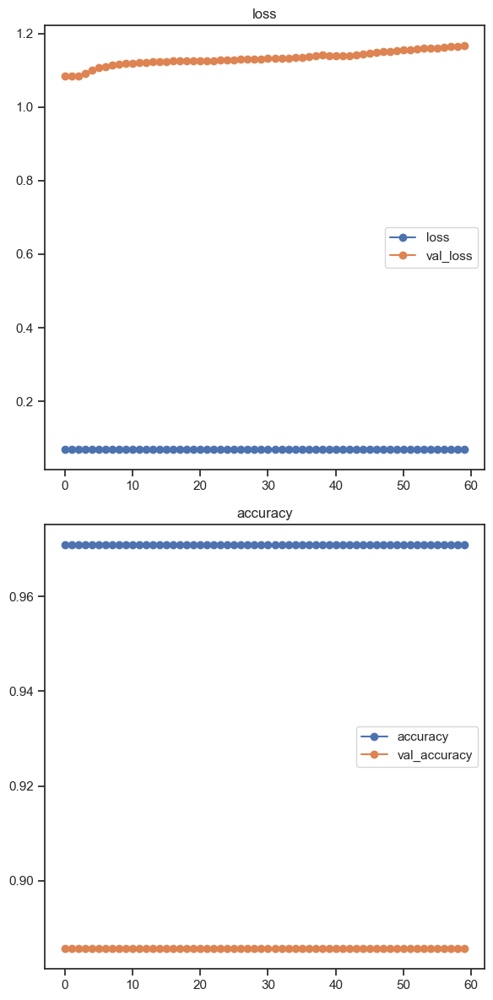

In [169]:
# Call custom function to plot metrics
plot_history(history_under);

5/5 [==============================] - 0s 1ms/step
----------------------------------------------------------------------
 Classification Metrics: 
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.22      0.77      0.34        26
           1       0.00      0.00      0.00        25
           2       0.00      0.00      0.00        30
           3       0.00      0.00      0.00        27
           4       0.40      0.63      0.49        30

    accuracy                           0.28       138
   macro avg       0.13      0.28      0.17       138
weighted avg       0.13      0.28      0.17       138



/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



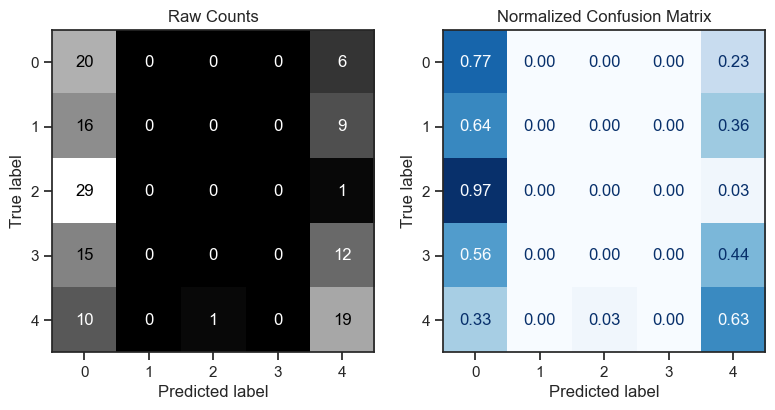

In [170]:
y_scores = model_under.predict(X_train_resampled_under)
y_pred = y_scores.argmax(axis=1)
y_true = y_train_resampled_under.argmax(axis=1)
classification_metrics(y_true, y_pred)

2/2 [==============================] - 0s 4ms/step
----------------------------------------------------------------------
 Classification Metrics: 
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.26      0.82      0.39        11
           1       0.00      0.00      0.00        12
           2       0.00      0.00      0.00         7
           3       0.00      0.00      0.00        10
           4       0.45      0.71      0.56         7

    accuracy                           0.30        47
   macro avg       0.14      0.31      0.19        47
weighted avg       0.13      0.30      0.17        47



/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



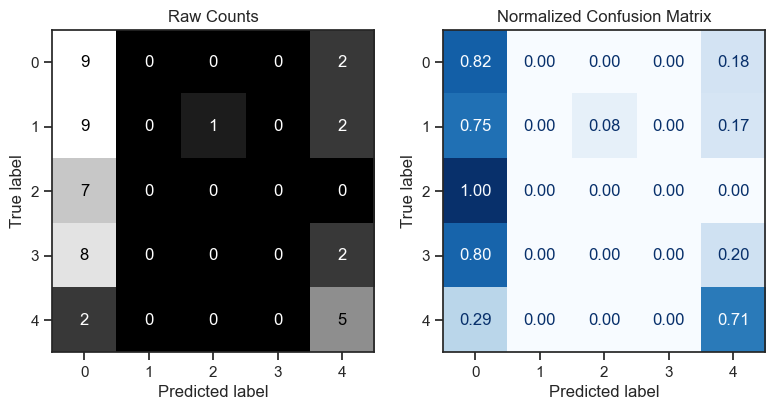

In [171]:
y_scores = model_under.predict(X_test_resampled_under)
y_pred = y_scores.argmax(axis=1)
y_true = y_test_resampled_under.argmax(axis=1)
classification_metrics(y_true, y_pred)

##  Synthetic Data Generation:
SMOTE (Synthetic Minority Over-sampling Technique):
* Generate synthetic examples for the minority class.
* Use SMOTE from the imbalanced-learn library.

In [172]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_resampled_smote, y_resampled_smote = smote.fit_resample(X, y)
X_train_resampled_smote, X_test_resampled_smote, y_train_resampled_smote, y_test_resampled_smote = train_test_split(X_resampled_smote, y_resampled_smote, test_size=0.25, random_state=42)

In [173]:
class_weights = {0: 1, 1: 1, 2: 1, 3: 1, 4: 10}  # Adjust the weight for the minority class
from tensorflow.keras.layers import Dropout
model_smote = Sequential()
model_smote.add(Dense(64, input_dim=X_train_resampled_smote.shape[1], activation='relu'))
model.add(Dropout(0.2))
model_smote.add(Dense(32, activation='relu'))
model.add(Dropout(0.6))
model_smote.add(Dense(y_train_resampled_smote.shape[1], activation='softmax'))

# Compile the model

model_smote.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history_smote = model_smote.fit(X_train_resampled_smote, y_train_resampled_smote, epochs=15, batch_size=32, validation_split=0.2)

# Evaluate the model
loss, accuracy = model_smote.evaluate(X_test_resampled_smote, y_test_resampled_smote)
print(f"Test Accuracy: {accuracy}")

Epoch 1/15
911/911 [==============================] - 2s 2ms/step - loss: 116.8373 - accuracy: 0.8282 - val_loss: 28.5061 - val_accuracy: 0.9356
Epoch 2/15
911/911 [==============================] - 2s 2ms/step - loss: 69.2399 - accuracy: 0.9152 - val_loss: 35.3322 - val_accuracy: 0.9423
Epoch 3/15
911/911 [==============================] - 2s 2ms/step - loss: 61.3992 - accuracy: 0.9234 - val_loss: 9.2238 - val_accuracy: 0.9440
Epoch 4/15
911/911 [==============================] - 2s 2ms/step - loss: 32.2862 - accuracy: 0.9372 - val_loss: 35.7109 - val_accuracy: 0.9474
Epoch 5/15
911/911 [==============================] - 2s 2ms/step - loss: 33.1763 - accuracy: 0.9352 - val_loss: 20.1118 - val_accuracy: 0.9303
Epoch 6/15
911/911 [==============================] - 2s 2ms/step - loss: 27.1694 - accuracy: 0.9455 - val_loss: 11.2687 - val_accuracy: 0.9373
Epoch 7/15
911/911 [==============================] - 1s 2ms/step - loss: 18.3983 - accuracy: 0.9442 - val_loss: 15.4855 - val_accuracy:

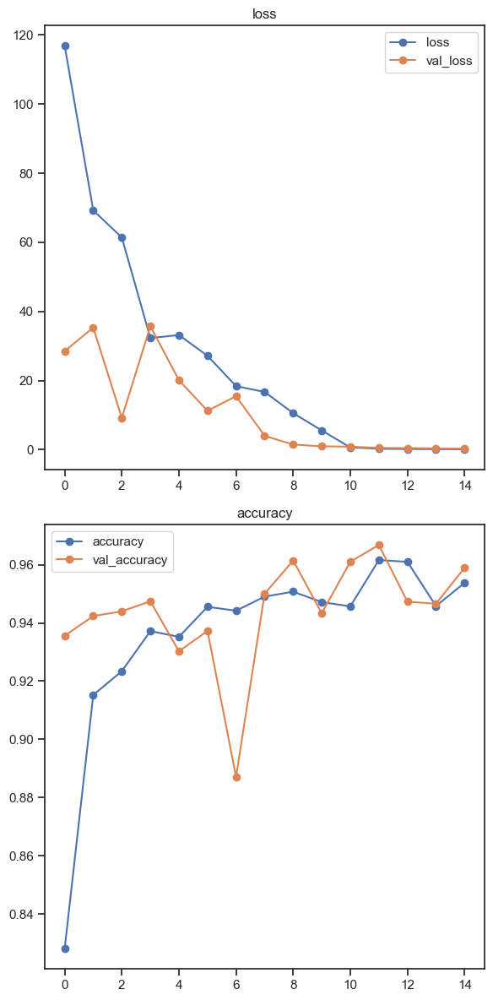

In [174]:
# Call custom function to plot metrics
plot_history(history_smote);

1138/1138 [==============================] - 1s 1ms/step
----------------------------------------------------------------------
 Classification Metrics: 
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      7302
           1       0.98      0.92      0.95      7341
           2       0.99      1.00      0.99      7220
           3       0.88      0.99      0.93      7269
           4       0.97      0.90      0.93      7284

    accuracy                           0.96     36416
   macro avg       0.96      0.96      0.96     36416
weighted avg       0.96      0.96      0.96     36416



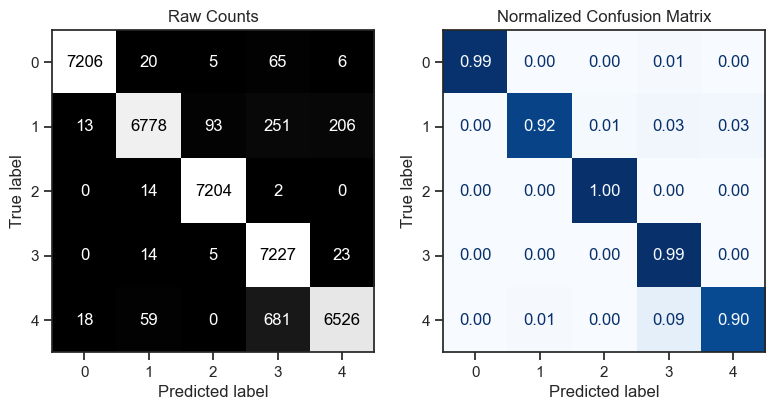

In [176]:
y_scores = model_smote.predict(X_train_resampled_smote)
y_pred = y_scores.argmax(axis=1)
y_true = y_train_resampled_smote.argmax(axis=1)
classification_metrics(y_true, y_pred)

380/380 [==============================] - 0s 1ms/step
----------------------------------------------------------------------
 Classification Metrics: 
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      2409
           1       0.98      0.92      0.95      2370
           2       0.99      1.00      0.99      2491
           3       0.88      0.99      0.93      2442
           4       0.97      0.89      0.93      2427

    accuracy                           0.96     12139
   macro avg       0.96      0.96      0.96     12139
weighted avg       0.96      0.96      0.96     12139



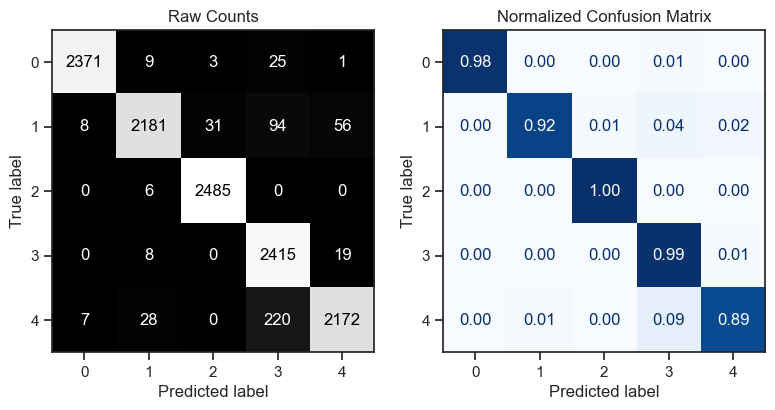

In [175]:
y_scores = model_smote.predict(X_test_resampled_smote)
y_pred = y_scores.argmax(axis=1)
y_true = y_test_resampled_smote.argmax(axis=1)
classification_metrics(y_true, y_pred)

In [187]:
model_smote = Sequential()
model_smote.add(Dense(64, input_dim=X_train_resampled_smote.shape[1], activation='relu'))
model.add(Dropout(0.4))
model_smote.add(Dense(32, activation='relu'))
model.add(Dropout(0.7))
model_smote.add(Dense(y_train_resampled_smote.shape[1], activation='softmax'))

# Compile the model

model_smote.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history_smote = model_smote.fit(X_train_resampled_smote, y_train_resampled_smote, epochs=25, batch_size=32, validation_split=0.2)

# Evaluate the model
loss, accuracy = model_smote.evaluate(X_test_resampled_smote, y_test_resampled_smote)
print(f"Test Accuracy: {accuracy}")

Epoch 1/25
911/911 [==============================] - 2s 2ms/step - loss: 110.1236 - accuracy: 0.8199 - val_loss: 32.1929 - val_accuracy: 0.9012
Epoch 2/25
911/911 [==============================] - 1s 2ms/step - loss: 74.7645 - accuracy: 0.9090 - val_loss: 12.1858 - val_accuracy: 0.9406
Epoch 3/25
911/911 [==============================] - 2s 2ms/step - loss: 71.5384 - accuracy: 0.9207 - val_loss: 60.7821 - val_accuracy: 0.9106
Epoch 4/25
911/911 [==============================] - 2s 2ms/step - loss: 47.7067 - accuracy: 0.9291 - val_loss: 59.1444 - val_accuracy: 0.9437
Epoch 5/25
911/911 [==============================] - 2s 2ms/step - loss: 40.5463 - accuracy: 0.9364 - val_loss: 2.3570 - val_accuracy: 0.9610
Epoch 6/25
911/911 [==============================] - 2s 2ms/step - loss: 25.6431 - accuracy: 0.9438 - val_loss: 8.1429 - val_accuracy: 0.9259
Epoch 7/25
911/911 [==============================] - 2s 2ms/step - loss: 24.6747 - accuracy: 0.9449 - val_loss: 6.8433 - val_accuracy: 0

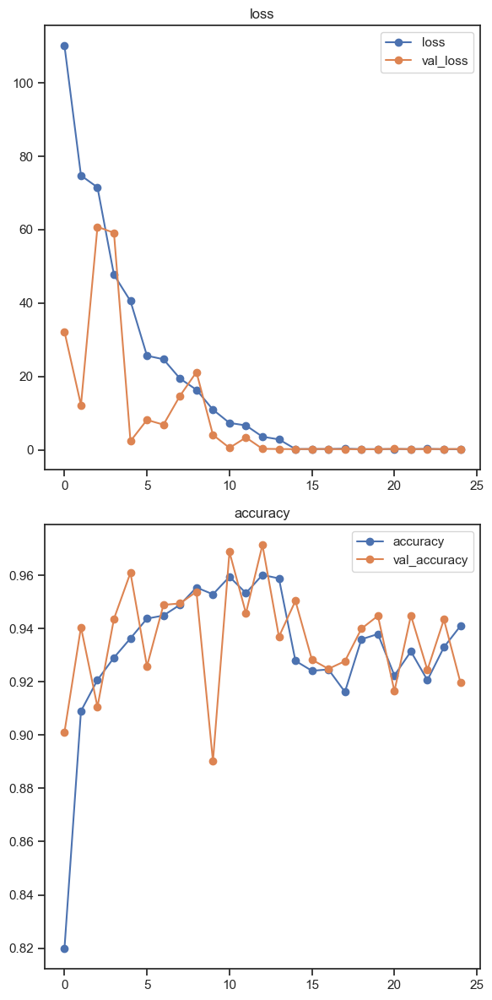

In [191]:
# Call custom function to plot metrics
plot_history(history_smote);

1138/1138 [==============================] - 2s 2ms/step
----------------------------------------------------------------------
 Classification Metrics: 
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      0.93      0.95      7302
           1       1.00      0.79      0.88      7341
           2       0.99      0.99      0.99      7220
           3       0.97      0.89      0.93      7269
           4       0.75      1.00      0.86      7284

    accuracy                           0.92     36416
   macro avg       0.94      0.92      0.92     36416
weighted avg       0.94      0.92      0.92     36416



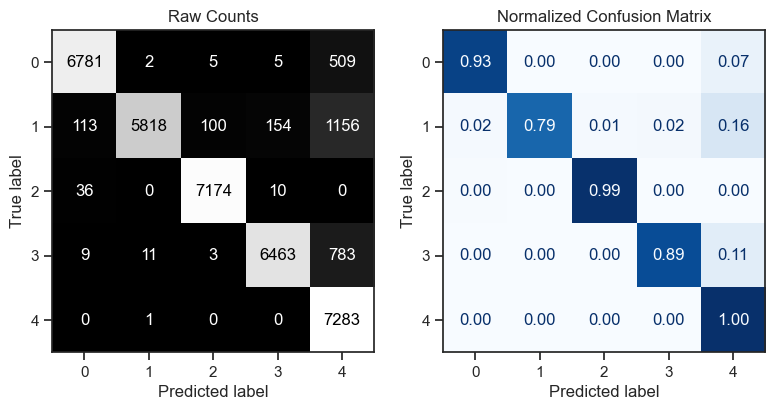

In [192]:
y_scores = model_smote.predict(X_train_resampled_smote)
y_pred = y_scores.argmax(axis=1)
y_true = y_train_resampled_smote.argmax(axis=1)
classification_metrics(y_true, y_pred)

380/380 [==============================] - 0s 1ms/step
----------------------------------------------------------------------
 Classification Metrics: 
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      0.92      0.95      2409
           1       1.00      0.81      0.89      2370
           2       0.99      0.99      0.99      2491
           3       0.97      0.88      0.92      2442
           4       0.75      1.00      0.86      2427

    accuracy                           0.92     12139
   macro avg       0.94      0.92      0.92     12139
weighted avg       0.94      0.92      0.92     12139



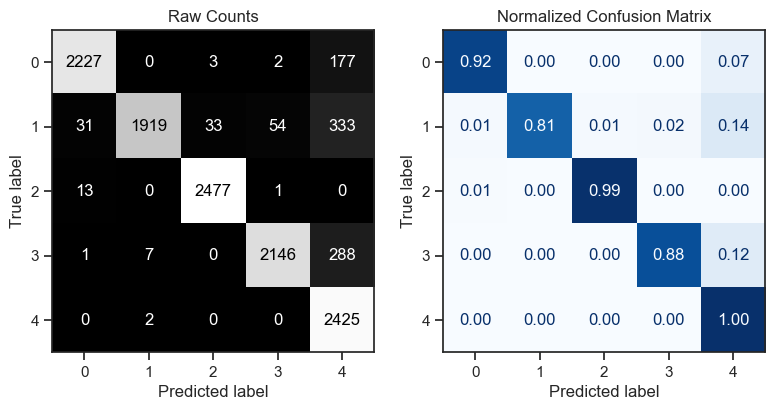

In [193]:
y_scores = model_smote.predict(X_test_resampled_smote)
y_pred = y_scores.argmax(axis=1)
y_true = y_test_resampled_smote.argmax(axis=1)
classification_metrics(y_true, y_pred)

## Weighted Models:
Class Weights:
* Assign higher weights to the minority class during model training.
* Supported in many machine learning frameworks.

In [177]:
class_weights = {0: 1, 1: 1, 2: 1, 3: 1, 4: 10}  # Adjust the weight for the minority class

model_smote_weights = Sequential()
model_smote_weights.add(Dense(64, input_dim=X_train_resampled_smote.shape[1], activation='relu'))
model_smote_weights.add(Dropout(0.3))
model_smote_weights.add(Dense(32, activation='relu'))
model_smote_weights.add(Dropout(0.4))
model_smote_weights.add(Dense(y_train_resampled_smote.shape[1], activation='softmax'))

# Compile the model

model_smote_weights.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history_smote_wight = model_smote_weights.fit(X_train_resampled_smote, y_train_resampled_smote, epochs=50, batch_size=32, validation_split=0.2, class_weight=class_weights)

# Evaluate the model
loss, accuracy = model_smote_weights.evaluate(X_test_resampled_smote, y_test_resampled_smote)
print(f"Test Accuracy: {accuracy}")

Epoch 1/50
911/911 [==============================] - 3s 2ms/step - loss: 723.6885 - accuracy: 0.3743 - val_loss: 19.7557 - val_accuracy: 0.3701
Epoch 2/50
911/911 [==============================] - 2s 2ms/step - loss: 43.4167 - accuracy: 0.3147 - val_loss: 1.4375 - val_accuracy: 0.3920
Epoch 3/50
911/911 [==============================] - 2s 2ms/step - loss: 12.4277 - accuracy: 0.3316 - val_loss: 1.4217 - val_accuracy: 0.4776
Epoch 4/50
911/911 [==============================] - 2s 2ms/step - loss: 5.1741 - accuracy: 0.3901 - val_loss: 1.4348 - val_accuracy: 0.4543
Epoch 5/50
911/911 [==============================] - 2s 2ms/step - loss: 4.2389 - accuracy: 0.4297 - val_loss: 1.1986 - val_accuracy: 0.5850
Epoch 6/50
911/911 [==============================] - 2s 2ms/step - loss: 2.5141 - accuracy: 0.5108 - val_loss: 0.9603 - val_accuracy: 0.6652
Epoch 7/50
911/911 [==============================] - 2s 2ms/step - loss: 1.9220 - accuracy: 0.5635 - val_loss: 0.9145 - val_accuracy: 0.7002
E

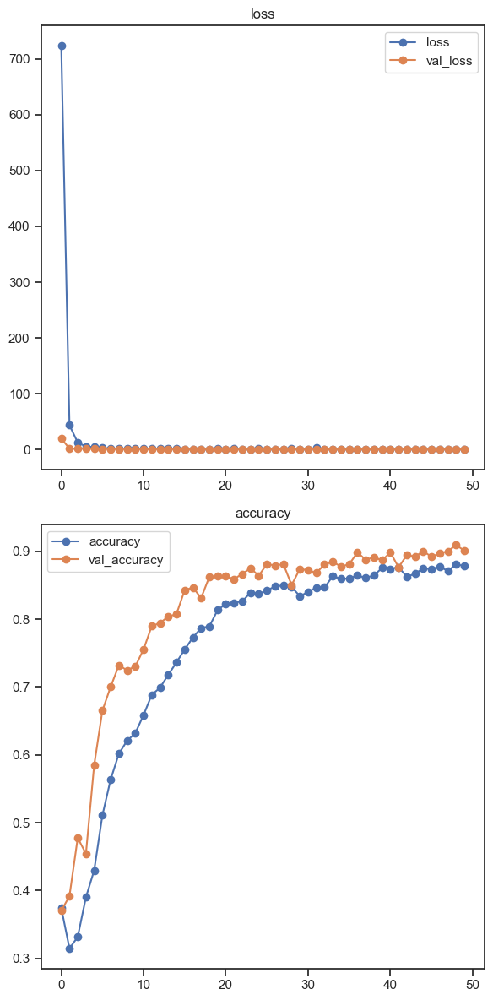

In [178]:
plot_history(history_smote_wight);

1138/1138 [==============================] - 1s 1ms/step
----------------------------------------------------------------------
 Classification Metrics: 
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      7302
           1       0.99      0.69      0.81      7341
           2       0.99      0.99      0.99      7220
           3       0.97      0.88      0.93      7269
           4       0.68      1.00      0.81      7284

    accuracy                           0.90     36416
   macro avg       0.93      0.90      0.90     36416
weighted avg       0.93      0.90      0.90     36416



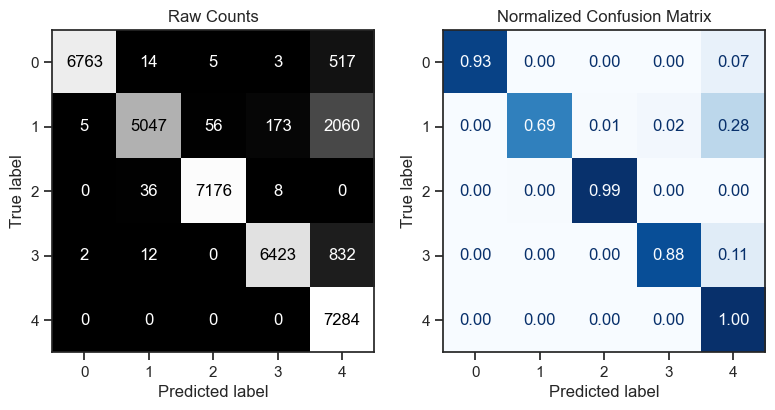

In [180]:
y_scores = model_smote_weights.predict(X_train_resampled_smote)
y_pred = y_scores.argmax(axis=1)
y_true = y_train_resampled_smote.argmax(axis=1)
classification_metrics(y_true, y_pred)

380/380 [==============================] - 0s 1ms/step
----------------------------------------------------------------------
 Classification Metrics: 
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.92      0.96      2409
           1       0.99      0.70      0.82      2370
           2       0.99      1.00      0.99      2491
           3       0.97      0.87      0.92      2442
           4       0.69      1.00      0.81      2427

    accuracy                           0.90     12139
   macro avg       0.93      0.90      0.90     12139
weighted avg       0.93      0.90      0.90     12139



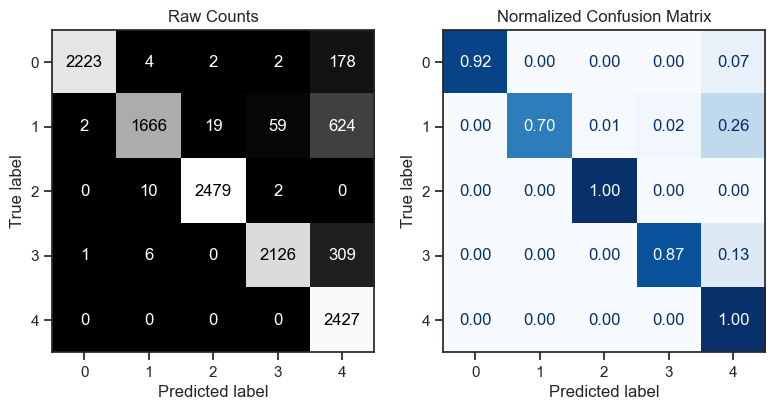

In [179]:
y_scores = model_smote_weights.predict(X_test_resampled_smote)
y_pred = y_scores.argmax(axis=1)
y_true = y_test_resampled_smote.argmax(axis=1)
classification_metrics(y_true, y_pred)

## Ensemble Techniques:
Use ensemble methods like BalancedRandomForest or EasyEnsemble.
### Install the necessary libraries using:

In [181]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


BalancedRandomForestClassifier in imbalanced-learn:
### Note:
* Make sure to replace X and y with your feature matrix and target variable.
* The choice of the method depends on your specific dataset and problem.

In [182]:
from imblearn.ensemble import BalancedRandomForestClassifier

brf = BalancedRandomForestClassifier(random_state=42)
brf.fit(X_train, y_train)

/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:546: FutureWarning:

The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.

/Users/khader/anaconda3/envs/ml/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:558: FutureWarning:

The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.



BalancedRandomForestClassifier(random_state=42)

In [196]:
# logreg_model.save('logreg_model')
# svm_model.save('svm_model')
model_over.save('model_over')
model.save('DL_model97acc')
model_under.save('model_under')
model_smote.save('model_smote96acc')
model_smote_weights('model_smote_weights')

INFO:tensorflow:Assets written to: model_over/assets


INFO:tensorflow:Assets written to: model_over/assets


INFO:tensorflow:Assets written to: DL_model97acc/assets


INFO:tensorflow:Assets written to: DL_model97acc/assets


INFO:tensorflow:Assets written to: model_under/assets


INFO:tensorflow:Assets written to: model_under/assets


INFO:tensorflow:Assets written to: model_smote96acc/assets


INFO:tensorflow:Assets written to: model_smote96acc/assets


TypeError: Inputs to a layer should be tensors. Got 'model_smote_weights' (of type <class 'str'>) as input for layer 'sequential_27'.